# Input Driven Observations ("GLM-HMM")

Notebook prepared by Zoe Ashwood: feel free to email me with feedback or questions (zashwood at cs dot princeton dot edu).

This notebook demonstrates the "InputDrivenObservations" class, and illustrates its use in the context of modeling decision-making data as in Ashwood et al. (2020) ([Mice alternate between discrete strategies during perceptual
decision-making](https://www.biorxiv.org/content/10.1101/2020.10.19.346353v1.full.pdf)).

Compared to the model considered in the notebook ["2 Input Driven HMM"](https://github.com/lindermanlab/ssm/blob/master/notebooks/2%20Input%20Driven%20HMM.ipynb), Ashwood et al. (2020) assumes a stationary transition matrix where transition probabilities *do not* depend on external inputs. However, observation probabilities now *do* depend on external covariates according to:


for $c \neq C$:
$$
\begin{align}
\Pr(y_t = c \mid z_{t} = k, u_t, w_{kc}) = 
\frac{\exp\{w_{kc}^\mathsf{T} u_t\}}
{1+\sum_{c'=1}^{C-1} \exp\{w_{kc'}^\mathsf{T} u_t\}}
\end{align}
$$

and for $c = C$:
$$
\begin{align}
\Pr(y_t = c \mid z_{t} = k, u_t, w_{kc}) = 
\frac{1}
{1+\sum_{c'=1}^{C-1} \exp\{w_{kc'}^\mathsf{T} u_t\}}
\end{align}
$$

where $c \in \{1, ..., C\}$ indicates the categorical class for the observation, $u_{t} \in \mathbb{R}^{M}$ is the set of input covariates, and $w_{kc} \in \mathbb{R}^{M}$ is the set of input weights associated with state $k$ and class $c$. These weights, along with the transition matrix and initial state probabilities, will be learned.

In Ashwood et al. (2020), $C = 2$ as $y_{t}$ represents the binary choice made by an animal during a 2AFC (2-Alternative Forced Choice) task. The above equations then reduce to:

$$
\begin{align}
\Pr(y_t = 0 \mid z_{t} = k, u_t, w_{k}) = 
\frac{\exp\{w_{k}^\mathsf{T} u_t\}}
{1 + \exp\{w_{k}^\mathsf{T} u_t\}} = \frac{1}
{1 + \exp\{-w_{k}^\mathsf{T} u_t\}}.
\end{align}
$$

$$
\begin{align}
\Pr(y_t = 1 \mid z_{t} = k, u_t, w_{k}) = 
\frac{1}
{1 + \exp\{w_{k}^\mathsf{T} u_t\}}.
\end{align}
$$

and only a single weight vector, $w_{k}$, is associated with each state.

## 1. Setup
The line `import ssm` imports the package for use. Here, we have also imported a few other packages for plotting.

In [1]:
file_path = 'intermediate_glm_hmm_results_new.pkl'
with open(file_path, 'rb') as f:
    data = pickle.load(f)

# Convert the loaded data into a DataFrame (if it isn't already)
loaded_results_df = pd.DataFrame(data)

# Display the loaded DataFrame with columns and rows
loaded_results_df

FileNotFoundError: [Errno 2] No such file or directory: 'intermediate_glm_hmm_results_new.pkl'

In [34]:
import numpy as np
import pandas as pd

import numpy.random as npr
import matplotlib.pyplot as plt
import ssm
from ssm.util import find_permutation
from joblib import Parallel, delayed
from sklearn.model_selection import KFold

npr.seed(0)

In [35]:
import warnings
warnings.filterwarnings('ignore')
from IPython.utils.capture import capture_output
import os, sys
import numpy as np
import pandas as pd
from importlib import reload

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
from tableone import TableOne

In [37]:
### rpy2
import sys
sys.executable
import rpy2
print(rpy2.__version__)
import os
os.environ['PATH'] = r'C:\Program Files\R\R-4.2.1\bin\x64'
os.environ['R_HOME'] = r'C:\Program Files\R\R-4.2.1' #path to your R installation
os.environ['R_USER'] = r'C:\Users\aynaz.adlzarrabi\Anaconda3\Lib\site-packages\rpy2' #path depends on where you installed Python. Mine is the Anaconda distribution
os.environ['R_LIBS_USER'] = r'C:\Program Files\R\R-4.2.1\library'
import rpy2.situation
for row in rpy2.situation.iter_info():
    print(row)
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
base = importr('base')
utils = importr('utils')
#%load_ext rpy2.ipython

3.5.6
rpy2 version:
3.5.6
Python version:
3.8.3 (tags/v3.8.3:6f8c832, May 13 2020, 22:37:02) [MSC v.1924 64 bit (AMD64)]
Looking for R's HOME:
    Environment variable R_HOME: C:\Program Files\R\R-4.2.1
    InstallPath in the registry: C:\Program Files\R\R-4.3.2
    Environment variable R_USER: C:\Users\aynaz.adlzarrabi\Anaconda3\Lib\site-packages\rpy2
    Environment variable R_LIBS_USER: C:\Program Files\R\R-4.2.1\library
R version:
    In the PATH: R version 4.2.1 (2022-06-23 ucrt) -- "Funny-Looking Kid"
    Loading R library from rpy2: OK
Additional directories to load R packages from:
None
C extension compilation:


In [38]:
import pingouin as pg
from scipy.stats import mannwhitneyu, probplot, shapiro,chi2_contingency, kruskal
from pymer4.models import Lm
from statsmodels.formula.api import ols
from statsmodels.stats import multicomp as mc
from statsmodels.stats.diagnostic import normal_ad, het_breuschpagan, acorr_ljungbox,kstest_fit

from statsmodels.stats.outliers_influence import variance_inflation_factor

The line `import ssm` imports the package for use. Here, we have also imported a few other packages for plotting.

In [10]:
# Set the parameters of the GLM-HMM
num_states = 2        # number of discrete states
obs_dim = 1           # number of observed dimensions
num_categories = 2    # number of categories for output
input_dim = 2         # input dimensions

# Make a GLM-HMM
true_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs", 
                   observation_kwargs=dict(C=num_categories), transitions="standard")

In [970]:
gen_weights = np.array([[[-6, 0]], [[0, 6]]])
gen_log_trans_mat = np.log(np.array([[[0.98, 0.02],  [ 0.06, 0.94]]]))
true_glmhmm.observations.params = gen_weights
true_glmhmm.transitions.params = gen_log_trans_mat

Text(0.5, 1.0, 'Generative transition matrix')

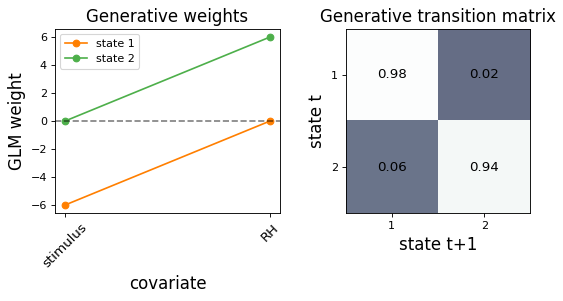

In [971]:
# Plot generative parameters:
fig = plt.figure(figsize=(8, 3), dpi=80, facecolor='w', edgecolor='k')
plt.subplot(1, 2, 1)
cols = ['#ff7f00', '#4daf4a', '#377eb8']
for k in range(num_states):
    plt.plot(range(input_dim), gen_weights[k][0], marker='o',
             color=cols[k], linestyle='-',
             lw=1.5, label="state " + str(k+1))
plt.yticks(fontsize=10)
plt.ylabel("GLM weight", fontsize=15)
plt.xlabel("covariate", fontsize=15)
plt.xticks([0, 1], ['stimulus', 'RH'], fontsize=12, rotation=45)
plt.axhline(y=0, color="k", alpha=0.5, ls="--")
plt.legend()
plt.title("Generative weights", fontsize = 15)

plt.subplot(1, 2, 2)
gen_trans_mat = np.exp(gen_log_trans_mat)[0]
plt.imshow(gen_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(gen_trans_mat.shape[0]):
    for j in range(gen_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(gen_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.ylabel("state t", fontsize = 15)
plt.xlabel("state t+1", fontsize = 15)
plt.title("Generative transition matrix", fontsize = 15)

In [980]:
num_sess = 20 # number of example sessions
num_trials_per_sess = 100 # number of trials in a session
inpts = np.ones((num_sess, num_trials_per_sess, input_dim)) # initialize inpts array
stim_vals = [-1, -0.5, -0.25, -0.125, -0.0625, 0, 0.0625, 0.125, 0.25, 0.5, 1]
inpts[:,:,0] = np.random.choice(stim_vals, (num_sess, num_trials_per_sess)) # generate random sequence of stimuli
inpts = list(inpts) #convert inpts to correct format
inpts

[array([[ 1.    ,  1.    ],
        [-0.0625,  1.    ],
        [ 0.    ,  1.    ],
        [ 0.    ,  1.    ],
        [ 1.    ,  1.    ],
        [ 0.    ,  1.    ],
        [ 0.125 ,  1.    ],
        [-0.125 ,  1.    ],
        [ 0.5   ,  1.    ],
        [-0.5   ,  1.    ],
        [-1.    ,  1.    ],
        [ 0.125 ,  1.    ],
        [-1.    ,  1.    ],
        [ 0.0625,  1.    ],
        [ 0.125 ,  1.    ],
        [-0.5   ,  1.    ],
        [ 0.0625,  1.    ],
        [ 0.25  ,  1.    ],
        [-0.25  ,  1.    ],
        [-0.25  ,  1.    ],
        [ 0.    ,  1.    ],
        [ 0.    ,  1.    ],
        [-0.125 ,  1.    ],
        [ 0.25  ,  1.    ],
        [-0.5   ,  1.    ],
        [ 0.0625,  1.    ],
        [-0.0625,  1.    ],
        [-0.25  ,  1.    ],
        [ 0.5   ,  1.    ],
        [ 0.    ,  1.    ],
        [ 0.125 ,  1.    ],
        [ 0.0625,  1.    ],
        [-0.5   ,  1.    ],
        [ 0.25  ,  1.    ],
        [-0.5   ,  1.    ],
        [ 0.25  ,  1

In [973]:
# Generate a sequence of latents and choices for each session
true_latents, true_choices = [], []
for sess in range(num_sess):
    true_z, true_y = true_glmhmm.sample(num_trials_per_sess, input=inpts[sess])
    true_latents.append(true_z)
    true_choices.append(true_y)

Text(0, 0.5, 'observation class')

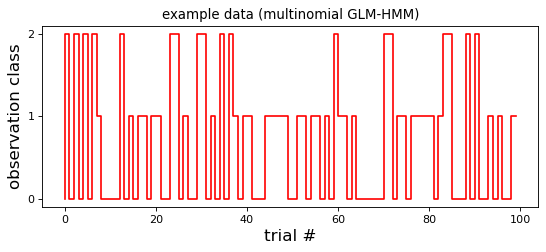

In [ ]:
# plot example data:
fig = plt.figure(figsize=(8, 3), dpi=80, facecolor='w', edgecolor='k')
plt.step(range(100),true_choices[0][range(100)], color = "red")
plt.yticks([0, 1, 2])
plt.title("example data (multinomial GLM-HMM)")
plt.xlabel("trial #", fontsize = 15)
plt.ylabel("observation class", fontsize = 15)

In [974]:
# Calculate true loglikelihood
true_ll = true_glmhmm.log_probability(true_choices, inputs=inpts) 
print("true ll = " + str(true_ll))

true ll = -823.5519552413825


In [975]:
new_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs", 
                   observation_kwargs=dict(C=num_categories), transitions="standard")

N_iters = 200 # maximum number of EM iterations. Fitting with stop earlier if increase in LL is below tolerance specified by tolerance parameter
fit_ll = new_glmhmm.fit(true_choices, inputs=inpts, method="em", num_iters=N_iters, tolerance=10**-4)

  0%|          | 0/200 [00:00<?, ?it/s]

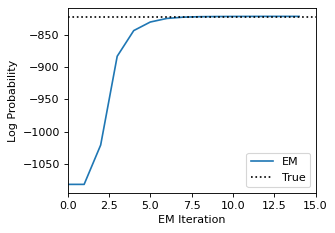

In [976]:
# Plot the log probabilities of the true and fit models. Fit model final LL should be greater 
# than or equal to true LL.
fig = plt.figure(figsize=(4, 3), dpi=80, facecolor='w', edgecolor='k')
plt.plot(fit_ll, label="EM")
plt.plot([0, len(fit_ll)], true_ll * np.ones(2), ':k', label="True")
plt.legend(loc="lower right")
plt.xlabel("EM Iteration")
plt.xlim(0, len(fit_ll))
plt.ylabel("Log Probability")
plt.show()

In [979]:
new_glmhmm.permute(find_permutation(true_latents[0], new_glmhmm.most_likely_states(true_choices[0], input=inpts[0])))

AssertionError: 

Text(0.5, 1.0, 'Weight recovery')

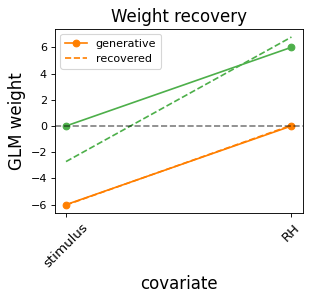

In [978]:
fig = plt.figure(figsize=(4, 3), dpi=80, facecolor='w', edgecolor='k')
cols = ['#ff7f00', '#4daf4a', '#377eb8']
recovered_weights = new_glmhmm.observations.params
for k in range(num_states):
    if k ==0:
        plt.plot(range(input_dim), gen_weights[k][0], marker='o',
                 color=cols[k], linestyle='-',
                 lw=1.5, label="generative")
        plt.plot(range(input_dim), recovered_weights[k][0], color=cols[k],
                     lw=1.5,  label = "recovered", linestyle = '--')
    else:
        plt.plot(range(input_dim), gen_weights[k][0], marker='o',
                 color=cols[k], linestyle='-',
                 lw=1.5, label="")
        plt.plot(range(input_dim), recovered_weights[k][0], color=cols[k],
                     lw=1.5,  label = '', linestyle = '--')
plt.yticks(fontsize=10)
plt.ylabel("GLM weight", fontsize=15)
plt.xlabel("covariate", fontsize=15)
plt.xticks([0, 1], ['stimulus', 'RH'], fontsize=12, rotation=45)
plt.axhline(y=0, color="k", alpha=0.5, ls="--")
plt.legend()
plt.title("Weight recovery", fontsize=15)

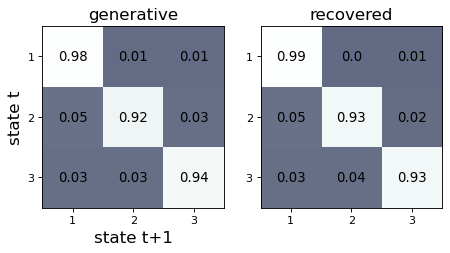

In [ ]:
fig = plt.figure(figsize=(5, 2.5), dpi=80, facecolor='w', edgecolor='k')
plt.subplot(1, 2, 1)
gen_trans_mat = np.exp(gen_log_trans_mat)[0]
plt.imshow(gen_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(gen_trans_mat.shape[0]):
    for j in range(gen_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(gen_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.ylabel("state t", fontsize = 15)
plt.xlabel("state t+1", fontsize = 15)
plt.title("generative", fontsize = 15)


plt.subplot(1, 2, 2)
recovered_trans_mat = np.exp(new_glmhmm.transitions.log_Ps)
plt.imshow(recovered_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(recovered_trans_mat.shape[0]):
    for j in range(recovered_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(recovered_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.title("recovered", fontsize = 15)
plt.subplots_adjust(0, 0, 1, 1)


In [981]:
# Get expected states:
posterior_probs = [new_glmhmm.expected_states(data=data, input=inpt)[0]
                for data, inpt
                in zip(true_choices, inpts)]

Text(0, 0.5, 'p(state)')

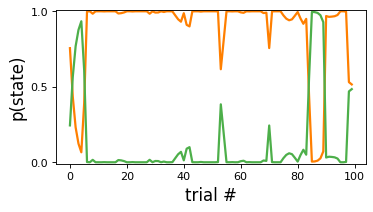

In [982]:
fig = plt.figure(figsize=(5, 2.5), dpi=80, facecolor='w', edgecolor='k')
sess_id = 0 #session id; can choose any index between 0 and num_sess-1
for k in range(num_states):
    plt.plot(posterior_probs[sess_id][:, k], label="State " + str(k + 1), lw=2,
             color=cols[k])
plt.ylim((-0.01, 1.01))
plt.yticks([0, 0.5, 1], fontsize = 10)
plt.xlabel("trial #", fontsize = 15)
plt.ylabel("p(state)", fontsize = 15)

In [ ]:
# concatenate posterior probabilities across sessions
posterior_probs_concat = np.concatenate(posterior_probs)
# get state with maximum posterior probability at particular trial:
state_max_posterior = np.argmax(posterior_probs_concat, axis = 1)
# now obtain state fractional occupancies:
_, state_occupancies = np.unique(state_max_posterior, return_counts=True)
state_occupancies = state_occupancies/np.sum(state_occupancies)

Text(0, 0.5, 'frac. occupancy')

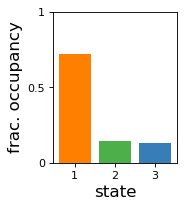

In [ ]:
fig = plt.figure(figsize=(2, 2.5), dpi=80, facecolor='w', edgecolor='k')
for z, occ in enumerate(state_occupancies):
    plt.bar(z, occ, width = 0.8, color = cols[z])
plt.ylim((0, 1))
plt.xticks([0, 1, 2], ['1', '2', '3'], fontsize = 10)
plt.yticks([0, 0.5, 1], ['0', '0.5', '1'], fontsize=10)
plt.xlabel('state', fontsize = 15)
plt.ylabel('frac. occupancy', fontsize=15)

In [ ]:
# Instantiate GLM-HMM and set prior hyperparameters
prior_sigma = 2
prior_alpha = 2
map_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs", 
             observation_kwargs=dict(C=num_categories,prior_sigma=prior_sigma),
             transitions="sticky", transition_kwargs=dict(alpha=prior_alpha,kappa=0))

In [ ]:
# Fit GLM-HMM with MAP estimation:
_ = map_glmhmm.fit(true_choices, inputs=inpts, method="em", num_iters=N_iters, tolerance=10**-4)

  0%|          | 0/25 [00:00<?, ?it/s]

In [ ]:
true_likelihood = true_glmhmm.log_likelihood(true_choices, inputs=inpts)
mle_final_ll = new_glmhmm.log_likelihood(true_choices, inputs=inpts) 
map_final_ll = map_glmhmm.log_likelihood(true_choices, inputs=inpts) 

Text(0, 0.5, 'loglikelihood')

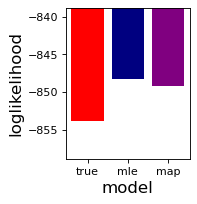

In [ ]:
# Plot these values
fig = plt.figure(figsize=(2, 2.5), dpi=80, facecolor='w', edgecolor='k')
loglikelihood_vals = [true_likelihood, mle_final_ll, map_final_ll]
colors = ['Red', 'Navy', 'Purple']
for z, occ in enumerate(loglikelihood_vals):
    plt.bar(z, occ, width = 0.8, color = colors[z])
plt.ylim((true_likelihood-5, true_likelihood+15))
plt.xticks([0, 1, 2], ['true', 'mle', 'map'], fontsize = 10)
plt.xlabel('model', fontsize = 15)
plt.ylabel('loglikelihood', fontsize=15)

Text(0.5, 1.0, 'Recovered transition matrix')

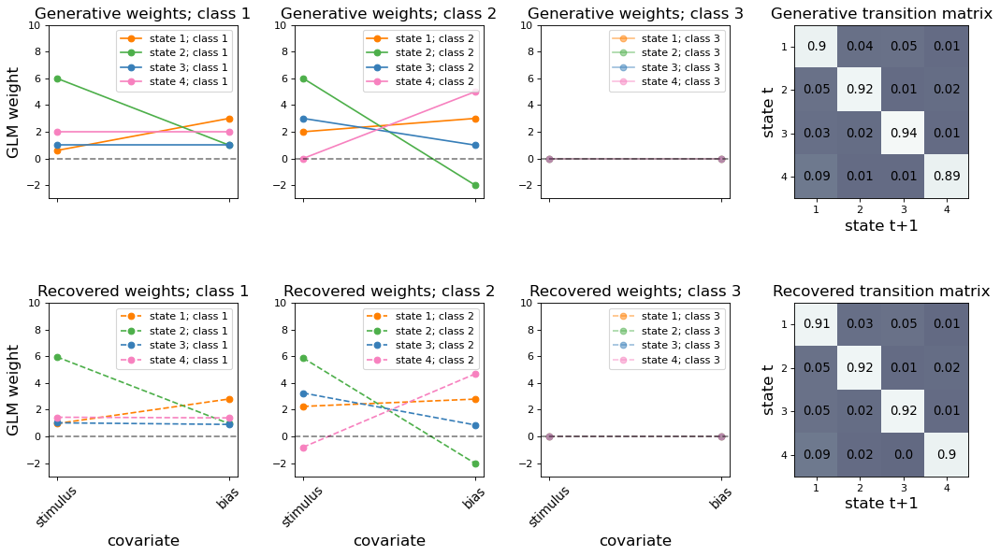

In [ ]:
# Plot recovered parameters:
recovered_weights = new_glmhmm.observations.params
recovered_transitions = new_glmhmm.transitions.params

fig = plt.figure(figsize=(16, 8), dpi=80, facecolor='w', edgecolor='k')
plt.subplots_adjust(wspace=0.3, hspace=0.6)

plt.subplot(2, 2, 1)
cols = ['#ff7f00', '#4daf4a', '#377eb8', '#f781bf', '#a65628', '#984ea3', '#999999', '#e41a1c', '#dede00']

for c in range(num_categories):
    plt.subplot(2, num_categories+1, c+1)
    if c < num_categories-1:
        for k in range(num_states):
            plt.plot(range(input_dim), gen_weights[k,c], marker='o',
                 color=cols[k], lw=1.5, label="state " + str(k+1) + "; class " + str(c+1))
    else:
        for k in range(num_states):
            plt.plot(range(input_dim), np.zeros(input_dim), marker='o',
                     color=cols[k], lw=1.5, label="state " + str(k+1) + "; class " + str(c+1), alpha = 0.5)

    plt.axhline(y=0, color="k", alpha=0.5, ls="--")
    plt.yticks(fontsize=10)
    plt.xticks([0, 1], ['', ''])
    if c == 0:
        plt.ylabel("GLM weight", fontsize=15)
    plt.legend()
    plt.title("Generative weights; class " + str(c+1), fontsize = 15)
    plt.ylim((-3, 10))
    
plt.subplot(2, num_categories+1, num_categories+1)
gen_trans_mat = np.exp(gen_log_trans_mat)[0]
plt.imshow(gen_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(gen_trans_mat.shape[0]):
    for j in range(gen_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(gen_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2', '3', '4'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2', '3', '4'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.ylabel("state t", fontsize = 15)
plt.xlabel("state t+1", fontsize = 15)
plt.title("Generative transition matrix", fontsize = 15)


cols = ['#ff7f00', '#4daf4a', '#377eb8', '#f781bf', '#a65628', '#984ea3', '#999999', '#e41a1c', '#dede00']

for c in range(num_categories):
    plt.subplot(2, num_categories+1, num_categories + c + 2)
    if c < num_categories-1:
        for k in range(num_states):
            plt.plot(range(input_dim), recovered_weights[k,c], marker='o', linestyle = '--',
                 color=cols[k], lw=1.5, label="state " + str(k+1) + "; class " + str(c+1))
    else:
        for k in range(num_states):
            plt.plot(range(input_dim), np.zeros(input_dim), marker='o', linestyle = '--',
                     color=cols[k], lw=1.5, label="state " + str(k+1) + "; class " + str(c+1), alpha = 0.5)

    plt.axhline(y=0, color="k", alpha=0.5, ls="--")
    plt.yticks(fontsize=10)
    plt.xlabel("covariate", fontsize=15)
    if c == 0:
        plt.ylabel("GLM weight", fontsize=15)
    plt.xticks([0, 1], ['stimulus', 'bias'], fontsize=12, rotation=45)
    plt.legend()
    plt.title("Recovered weights; class " + str(c+1), fontsize = 15)
    plt.ylim((-3,10))
    
plt.subplot(2, num_categories+1, 2*num_categories+2)
recovered_trans_mat = np.exp(recovered_transitions)[0]
plt.imshow(recovered_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(recovered_trans_mat.shape[0]):
    for j in range(recovered_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(recovered_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2', '3', '4'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2', '3', '4'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.ylabel("state t", fontsize = 15)
plt.xlabel("state t+1", fontsize = 15)
plt.title("Recovered transition matrix", fontsize = 15)

## 1.load data

In [39]:
revcor_data=pd.read_csv('data/revcor_data.csv', index_col=0, parse_dates=['date'])
revcor_data

,old_subject,trial,block,sex,age,date,stim,stim_order,segment,segment_time,pitch,response,rt,type,experimentor,session,subject
0,12,0,0,m,70.0,2019-12-02 15:26:04.752128,male_vraiment_flat_141.wav,0,0,0.000000,7.977104,True,12.930,patients,bardet,1,16
1,12,0,0,m,70.0,2019-12-02 15:26:04.752128,male_vraiment_flat_141.wav,0,1,0.071043,82.432249,True,12.930,patients,bardet,1,16
2,12,0,0,m,70.0,2019-12-02 15:26:04.752128,male_vraiment_flat_141.wav,0,2,0.142086,132.317275,True,12.930,patients,bardet,1,16
3,12,0,0,m,70.0,2019-12-02 15:26:04.752128,male_vraiment_flat_141.wav,0,3,0.213129,-14.753525,True,12.930,patients,bardet,1,16
4,12,0,0,m,70.0,2019-12-02 15:26:04.752128,male_vraiment_flat_141.wav,0,4,0.284172,-26.994032,True,12.930,patients,bardet,1,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
174841,5,600,6,NaN,NaN,2016-05-23 00:00:00.000000,Sub5_Trial595_1.wav,1,2,2.000000,13.496392,False,1.622,controls,ponsot,1,11
174842,5,600,6,NaN,NaN,2016-05-23 00:00:00.000000,Sub5_Trial595_1.wav,1,3,3.000000,-30.745334,False,1.622,controls,ponsot,1,11
174843,5,600,6,NaN,NaN,2016-05-23 00:00:00.000000,Sub5_Trial595_1.wav,1,4,4.000000,-13.769432,False,1.622,controls,ponsot,1,11
174844,5,600,6,NaN,NaN,2016-05-23 00:00:00.000000,Sub5_Trial595_1.wav,1,5,5.000000,-0.266028,False,1.622,controls,ponsot,1,11


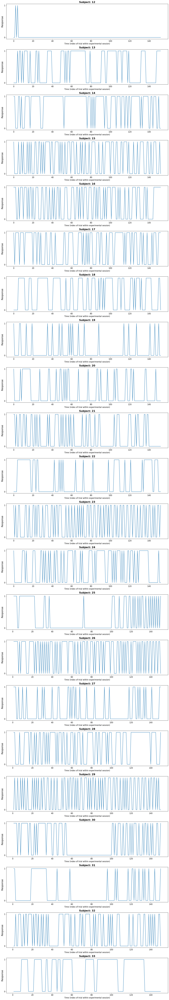

In [12]:
# Assuming revcor_data is already defined and available
patient_sessions = revcor_data[(revcor_data.type == "patients") & 
                               (revcor_data.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

num_rows = len(patient_sessions)

# Increase the figure size to make each plot larger
fig, axs = plt.subplots(num_rows, 1, figsize=(15, num_rows * 4))

for i, patient_session in enumerate(zip(patient_sessions.subject, patient_sessions.session)):
    patient = patient_session[0]
    session = patient_session[1]
    
    # Filter the data for the current patient and session
    patient_responses = revcor_data[(revcor_data.subject == patient) & 
                                    (revcor_data.session == session) & 
                                    (revcor_data.stim_order == 0)].groupby('trial')['response'].first()
    
    # Plot the patient responses for each session
    axs[i].plot(patient_responses)
    axs[i].set_yticks([0, 1])
    axs[i].set_ylabel('Response', fontsize=15)
    axs[i].set_xlabel('Time (index of trial within experimental session)', fontsize=12)
    axs[i].grid(False)
    axs[i].set_facecolor('white')
    axs[i].tick_params(axis='both', which='major', labelsize=12)
    
    # Set the title with the subject's name at the top of the plot
    axs[i].set_title(f'Subject: {patient}', fontsize=16, fontweight='bold')

# Adjust the layout to avoid overlap between subplots
plt.tight_layout()
plt.show()

In [13]:
revcor_measures=pd.read_csv('data/revcor_measures.csv', index_col=0)
revcor_measures

,index,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,accuracy
0,0,bardet,patients,12,1,0.991552,0.699038,0.00,1.00,5.00,0.10,0.486667
1,1,bardet,patients,13,1,1.506980,0.534778,0.54,0.56,0.30,2.15,0.553333
2,2,bardet,patients,14,1,1.075963,0.672138,0.77,0.66,3.60,3.30,0.540000
3,3,bardet,patients,15,1,0.186231,0.955683,0.48,0.80,0.05,0.50,0.766667
4,4,bardet,patients,16,1,0.221178,0.944546,0.54,0.68,0.20,0.95,0.660000
...,...,...,...,...,...,...,...,...,...,...,...,...
63,63,ponsot,controls,7,1,0.192901,0.953558,NaN,NaN,NaN,NaN,0.633333
64,64,ponsot,controls,8,1,0.115509,0.978221,NaN,NaN,NaN,NaN,0.760000
65,65,ponsot,controls,9,1,0.663691,0.803523,NaN,NaN,NaN,NaN,0.513333
66,66,ponsot,controls,10,1,0.506945,0.853476,NaN,NaN,NaN,NaN,0.586667


In [14]:
kernels=pd.read_csv('data/kernels.csv', index_col=0)
kernels

,level_0,index,experimentor,type,subject,session,segment,kernel_value,norm_value,new_type
0,0,0,bardet,patients,12,1,0,22.474069,1.386270,patients with MEC<=9
1,1,1,bardet,patients,12,1,1,8.660022,0.534177,patients with MEC<=9
2,2,2,bardet,patients,12,1,2,6.771886,0.417711,patients with MEC<=9
3,3,3,bardet,patients,12,1,3,1.764469,0.108838,patients with MEC<=9
4,4,4,bardet,patients,12,1,4,28.168453,1.737518,patients with MEC<=9
...,...,...,...,...,...,...,...,...,...,...
471,471,471,ponsot,controls,11,1,2,-6.121455,-0.311320,NaN
472,472,472,ponsot,controls,11,1,3,4.609288,0.234415,NaN
473,473,473,ponsot,controls,11,1,4,5.327733,0.270953,NaN
474,474,474,ponsot,controls,11,1,5,47.331165,2.407129,NaN


In [40]:
revcor=revcor_data[['type','subject','block','trial','stim_order','session','segment','pitch','rt','response','experimentor']]
#patients = [12, 13, 14, 19, 22, 25, 27, 28, 30, 31, 33]

#revcor = revcor[(revcor.type == "patients") &  (revcor.subject.isin(patients))&(revcor.session == 1)]
revcor['response'] = revcor['response'].astype(int)

revcor

,type,subject,block,trial,stim_order,session,segment,pitch,rt,response,experimentor
0,patients,16,0,0,0,1,0,7.977104,12.930,1,bardet
1,patients,16,0,0,0,1,1,82.432249,12.930,1,bardet
2,patients,16,0,0,0,1,2,132.317275,12.930,1,bardet
3,patients,16,0,0,0,1,3,-14.753525,12.930,1,bardet
4,patients,16,0,0,0,1,4,-26.994032,12.930,1,bardet
...,...,...,...,...,...,...,...,...,...,...,...
174841,controls,11,6,600,1,1,2,13.496392,1.622,0,ponsot
174842,controls,11,6,600,1,1,3,-30.745334,1.622,0,ponsot
174843,controls,11,6,600,1,1,4,-13.769432,1.622,0,ponsot
174844,controls,11,6,600,1,1,5,-0.266028,1.622,0,ponsot


## Response sequence of patients

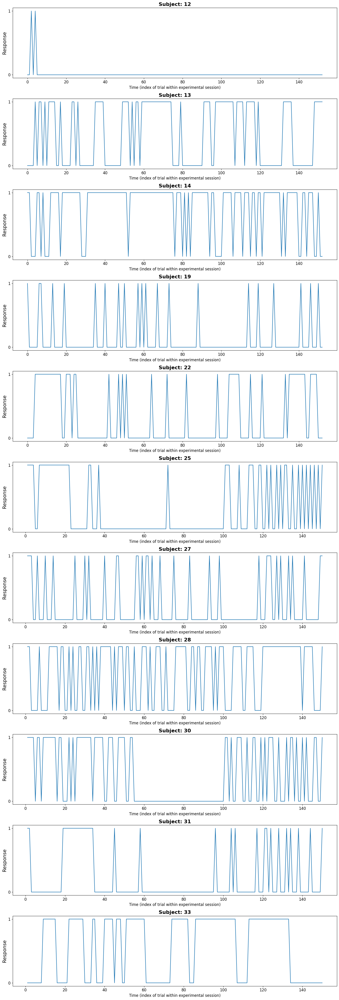

In [16]:
#patients = [12, 13, 14, 19, 22, 25, 27, 28, 30, 31, 33]

patient_sessions = revcor[(revcor.type == "patients") &  (revcor.subject.isin(patients))&
                               (revcor.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

num_rows = len(patient_sessions)

# Increase the figure size to make each plot larger
fig, axs = plt.subplots(num_rows, 1, figsize=(15, num_rows * 4))

for i, patient_session in enumerate(zip(patient_sessions.subject, patient_sessions.session)):
    patient = patient_session[0]
    session = patient_session[1]
    
    # Filter the data for the current patient and session
    patient_responses = revcor[(revcor.subject == patient) & 
                                    (revcor.session == session) & 
                                    (revcor.stim_order == 0)].groupby('trial')['response'].first()
    
    # Plot the patient responses for each session
    axs[i].plot(patient_responses)
    axs[i].set_yticks([0, 1])
    axs[i].set_ylabel('Response', fontsize=15)
    axs[i].set_xlabel('Time (index of trial within experimental session)', fontsize=12)
    axs[i].grid(False)
    axs[i].set_facecolor('white')
    axs[i].tick_params(axis='both', which='major', labelsize=12)
    
    # Set the title with the subject's name at the top of the plot
    axs[i].set_title(f'Subject: {patient}', fontsize=16, fontweight='bold')

# Adjust the layout to avoid overlap between subplots
plt.tight_layout()
plt.show()

## Extracting kernels by GLM

In [17]:
revcor.groupby(['type','subject','experimentor']).agg({'block':'unique','trial':'nunique'})

block  trial
type     subject experimentor                     
patients 12      bardet        [0, 1, 2, 3]    153
         13      bardet        [0, 1, 2, 3]    153
         14      bardet        [0, 1, 2, 3]    153
         19      commere       [0, 1, 2, 3]    153
         22      commere       [0, 1, 2, 3]    153
         25      jeulin           [1, 2, 3]    150
         27      jeulin           [1, 2, 3]    150
         28      jeulin           [1, 2, 3]    150
         30      jeulin           [1, 2, 3]    150
         31      jeulin           [1, 2, 3]    150
         33      jeulin           [1, 2, 3]    150

In [18]:
revcor_data=pd.read_csv('data/revcor_data.csv', index_col=0, parse_dates=['date'])

revcor=revcor_data[['type','subject','block','trial','stim_order','session','segment','pitch','rt','response','experimentor']]
#patients = [12, 13, 14, 19, 22, 25, 27, 28, 30, 31, 33]

#revcor = revcor[(revcor.type == "patients") &  (revcor.subject.isin(patients))&(revcor.session == 1)]
revcor['response'] = revcor['response'].astype(int)

revcor

,type,subject,block,trial,stim_order,session,segment,pitch,rt,response,experimentor
0,patients,16,0,0,0,1,0,7.977104,12.930,1,bardet
1,patients,16,0,0,0,1,1,82.432249,12.930,1,bardet
2,patients,16,0,0,0,1,2,132.317275,12.930,1,bardet
3,patients,16,0,0,0,1,3,-14.753525,12.930,1,bardet
4,patients,16,0,0,0,1,4,-26.994032,12.930,1,bardet
...,...,...,...,...,...,...,...,...,...,...,...
174841,controls,11,6,600,1,1,2,13.496392,1.622,0,ponsot
174842,controls,11,6,600,1,1,3,-30.745334,1.622,0,ponsot
174843,controls,11,6,600,1,1,4,-13.769432,1.622,0,ponsot
174844,controls,11,6,600,1,1,5,-0.266028,1.622,0,ponsot


In [41]:
pivoted_df = revcor.pivot_table(index=['type', 'subject', 'block', 'trial','stim_order','session','rt', 'response','experimentor'],
                            columns='segment',
                            values='pitch',
                            aggfunc='first').reset_index()

pivoted_df.columns = ['type', 'subject', 'block', 'trial','stim_order','session', 'rt','response','experimentor'] + [f'pitch{col}' for col in range(7)]

pivoted_df.reset_index(inplace=True, drop=True)
pivoted_df['response'] = pivoted_df['response'].astype(int)
pivoted_df=pivoted_df[(pivoted_df.session==1)&(pivoted_df.session==1)]
pivoted_df


,type,subject,block,trial,stim_order,session,rt,response,experimentor,pitch0,pitch1,pitch2,pitch3,pitch4,pitch5,pitch6
0,controls,0,1,1,0,1,0.868,0,jeulin,64.335082,25.012194,19.462201,-2.760596,5.243116,-16.730048,-124.503364
2,controls,0,1,1,1,1,0.868,1,jeulin,7.038557,2.453242,100.632186,-1.389851,2.053347,152.217477,39.381753
4,controls,0,1,2,0,1,1.201,0,jeulin,-39.960153,-15.974700,68.708502,-147.627715,-67.767149,-105.360249,20.899837
6,controls,0,1,2,1,1,1.201,1,jeulin,-58.312375,-130.679740,-83.105776,115.439092,-41.435679,141.103691,8.711059
8,controls,0,1,3,0,1,1.164,1,jeulin,17.480154,-63.521198,13.253487,23.370158,164.548980,66.734331,-23.202349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24958,patients,33,3,148,1,1,3.409,1,jeulin,29.001011,1.944873,-102.978964,-30.081088,10.795725,-92.564736,61.478651
24962,patients,33,3,149,0,1,2.302,0,jeulin,-25.525201,-59.939740,114.474724,122.921205,18.029932,-11.542198,-32.371835
24966,patients,33,3,149,1,1,2.302,1,jeulin,-18.885660,-116.445634,-21.261117,114.606094,-26.102932,-164.725431,42.678116
24970,patients,33,3,150,0,1,7.808,0,jeulin,-56.861061,-81.927625,-6.810868,-3.951543,67.878107,49.819815,43.145271


In [43]:
df = pd.DataFrame(pivoted_df)

# Assuming pitch columns are 'pitch0' to 'pitch6'
pitch_columns = ['pitch0', 'pitch1', 'pitch2', 'pitch3', 'pitch4', 'pitch5', 'pitch6']

# Separate the DataFrame into two DataFrames based on stim_order
df_stim0 = df[df['stim_order'] == 0].copy()
df_stim1 = df[df['stim_order'] == 1].copy()

# Make sure the indexes match for direct row-wise subtraction
df_stim0.set_index(['subject', 'block', 'trial', 'session'], inplace=True)
df_stim1.set_index(['subject', 'block', 'trial', 'session'], inplace=True)

# Calculate the differences for each pitch column and store in a new DataFrame
df_diff = pd.DataFrame(index=df_stim0.index)
for pitch in pitch_columns:
    df_diff[f'diff_{pitch}'] = df_stim1[pitch] - df_stim0[pitch]

# Reset index to bring the grouping columns back as normal columns
df_diff.reset_index(inplace=True)

# Assuming we want to add the 'type' column from the original DataFrame
# We'll take the 'type' from df_stim0 since it should match df_stim1 for the same group
df_diff['type'] = df_stim1['type'].values
df_diff['response_s0'] = df_stim0['response'].values
df_diff['response_s1'] = df_stim1['response'].values

df_diff.drop(columns=['response_s0'], inplace=True)
df_diff=df_diff.rename(columns={'response_s1': 'response'})
df_diff

,subject,block,trial,session,diff_pitch0,diff_pitch1,diff_pitch2,diff_pitch3,diff_pitch4,diff_pitch5,diff_pitch6,type,response
0,0,1,1,1,-57.296525,-22.558952,81.169985,1.370745,-3.189769,168.947525,163.885117,controls,1
1,0,1,2,1,-18.352222,-114.705040,-151.814278,263.066807,26.331470,246.463940,-12.188778,controls,1
2,0,1,3,1,78.731259,10.176666,-96.693678,55.869643,-174.212039,-99.264377,-25.138424,controls,0
3,0,1,4,1,-87.475958,54.724313,-40.577114,-70.197103,-73.425468,-119.758598,105.576671,controls,1
4,0,1,5,1,-5.582327,-150.519672,-21.759324,220.230883,-76.064585,226.025474,-101.136959,controls,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7384,33,3,146,1,-246.742182,38.755183,-88.022859,120.151641,300.567051,-46.362716,-22.581438,patients,1
7385,33,3,147,1,-144.402584,-58.698700,73.716244,190.908663,17.699194,-122.224662,12.505070,patients,1
7386,33,3,148,1,-35.379595,-110.286604,-90.305739,-78.540428,39.286023,-67.284980,106.078733,patients,1
7387,33,3,149,1,6.639541,-56.505894,-135.735841,-8.315111,-44.132864,-153.183233,75.049951,patients,1


In [42]:
df = pd.DataFrame(pivoted_df)

# Assuming pitch columns are 'pitch0' to 'pitch6'
pitch_columns = ['pitch0', 'pitch1', 'pitch2', 'pitch3', 'pitch4', 'pitch5', 'pitch6']

# Separate the DataFrame into two DataFrames based on stim_order
df_stim0 = df[df['stim_order'] == 0].copy()
df_stim1 = df[df['stim_order'] == 1].copy()

# Make sure the indexes match for direct row-wise subtraction
df_stim0.set_index(['subject', 'block', 'trial', 'session'], inplace=True)
df_stim1.set_index(['subject', 'block', 'trial', 'session'], inplace=True)

# Calculate the differences for each pitch column and store in a new DataFrame
df_diff = pd.DataFrame(index=df_stim0.index)
for pitch in pitch_columns:
    df_diff[f'diff_{pitch}'] = df_stim0[pitch] - df_stim1[pitch]

# Reset index to bring the grouping columns back as normal columns
df_diff.reset_index(inplace=True)

# Assuming we want to add the 'type' column from the original DataFrame
# We'll take the 'type' from df_stim0 since it should match df_stim1 for the same group
df_diff['type'] = df_stim0['type'].values
df_diff['response_s0'] = df_stim0['response'].values
df_diff['response_s1'] = df_stim1['response'].values

df_diff.drop(columns=['response_s1'], inplace=True)
df_diff=df_diff.rename(columns={'response_s0': 'response'})
df_diff

,subject,block,trial,session,diff_pitch0,diff_pitch1,diff_pitch2,diff_pitch3,diff_pitch4,diff_pitch5,diff_pitch6,type,response
0,0,1,1,1,57.296525,22.558952,-81.169985,-1.370745,3.189769,-168.947525,-163.885117,controls,0
1,0,1,2,1,18.352222,114.705040,151.814278,-263.066807,-26.331470,-246.463940,12.188778,controls,0
2,0,1,3,1,-78.731259,-10.176666,96.693678,-55.869643,174.212039,99.264377,25.138424,controls,1
3,0,1,4,1,87.475958,-54.724313,40.577114,70.197103,73.425468,119.758598,-105.576671,controls,0
4,0,1,5,1,5.582327,150.519672,21.759324,-220.230883,76.064585,-226.025474,101.136959,controls,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7384,33,3,146,1,246.742182,-38.755183,88.022859,-120.151641,-300.567051,46.362716,22.581438,patients,0
7385,33,3,147,1,144.402584,58.698700,-73.716244,-190.908663,-17.699194,122.224662,-12.505070,patients,0
7386,33,3,148,1,35.379595,110.286604,90.305739,78.540428,-39.286023,67.284980,-106.078733,patients,0
7387,33,3,149,1,-6.639541,56.505894,135.735841,8.315111,44.132864,153.183233,-75.049951,patients,0


In [13]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
import numpy as np

# Filter the dataset for subject 30
subject_30_data = df_diff[df_diff['subject'] == 30]

# Add a constant term to the predictors (7 pitch differences)
X = sm.add_constant(subject_30_data[['diff_pitch0', 'diff_pitch1', 'diff_pitch2', 'diff_pitch3', 'diff_pitch4', 'diff_pitch5', 'diff_pitch6']])

# Fit the logistic regression model
model = sm.Logit(subject_30_data['response'], X)
result = model.fit()

# Print the summary of the model to check the coefficients
print(result.summary())

# Generate predicted probabilities for a range of pitch differences (stimulus)
stimulus_values = np.linspace(X.iloc[:, 1:].min().min(), X.iloc[:, 1:].max().max(), 300)
mean_pitch_diffs = np.mean(subject_30_data[['diff_pitch0', 'diff_pitch1', 'diff_pitch2', 'diff_pitch3', 'diff_pitch4', 'diff_pitch5', 'diff_pitch6']], axis=1)

# Create an input matrix for predictions (using mean pitch differences)
mean_pitch_diff_values = sm.add_constant(np.tile(stimulus_values, (7, 1)).T)

# Predict the probabilities using the fitted model
y_pred = result.predict(mean_pitch_diff_values)




Optimization terminated successfully.
         Current function value: 0.648367
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:               response   No. Observations:                  150
Model:                          Logit   Df Residuals:                      142
Method:                           MLE   Df Model:                            7
Date:                Sun, 13 Oct 2024   Pseudo R-squ.:                 0.04693
Time:                        12:58:18   Log-Likelihood:                -97.255
converged:                       True   LL-Null:                       -102.04
Covariance Type:            nonrobust   LLR p-value:                    0.2138
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -0.2689      0.172     -1.560      0.119      -0.607       0.069
diff_pitch0    -0.0016    

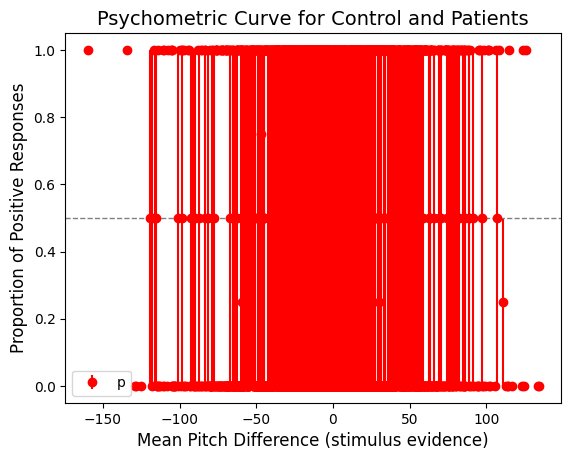

In [14]:
def plot_data_psychometric_pitch(df):
    """
    Plots the psychometric function based on pitch differences.
    Args:
       df (dataframe): dataset.
    """
    # Compute mean pitch difference per trial (averaging across the 7 pitch segments)
    df_diff['mean_pitch_diff'] = df_diff[['diff_pitch0', 'diff_pitch1', 'diff_pitch2', 'diff_pitch3', 'diff_pitch4', 'diff_pitch5', 'diff_pitch6']].mean(axis=1)
    
    # Plot psychometric curve for manipulation (patients) trials
    mask = df_diff['type'] == 'patients'  # select patient trials
    patient_data = df_diff[mask].groupby('mean_pitch_diff')['response'].agg(['mean', 'sem'])
    patient_data.plot(y='mean', yerr='sem', fmt='ro', ax=plt.gca(), legend=False)

    # Add labels and legends
    plt.legend(('patients'), loc='best')
    plt.xlabel('Mean Pitch Difference (stimulus evidence)', fontsize=12)
    plt.ylabel('Proportion of Positive Responses', fontsize=12)
    plt.title('Psychometric Curve for Control and Patients', fontsize=14)
    plt.axhline(0.5, color='gray', linestyle='--', lw=1)  # Add reference line at 0.5
    plt.show()

# Apply the function to your dataframe 
plot_data_psychometric_pitch(df_diff)


## regression by Palin

In [21]:
def compute_kernel_CI(data_df, trial_ids=['experimentor', 'type', 'subject', 'session'],
                      dimension_id='segment', response_id='response', value_id='pitch'):
    # Grouping by trial_ids and dimension_id, and calculating the mean of value_id
    dimension_mean_value = data_df.groupby(trial_ids + [dimension_id, response_id])[value_id].mean().reset_index()

    # Separating the positives and negatives
    positives = dimension_mean_value.loc[dimension_mean_value[response_id] == True].reset_index()
    negatives = dimension_mean_value.loc[dimension_mean_value[response_id] == False].reset_index()

    # Merging positives and negatives and computing kernel values
    kernels = pd.merge(positives, negatives, on=trial_ids + [dimension_id])
    kernels['kernel_value'] = kernels[f'{value_id}_x'] - kernels[f'{value_id}_y']

    # Normalizing the kernels
    kernels['square_value'] = kernels['kernel_value'] ** 2
    for_norm = kernels.groupby(trial_ids)['square_value'].mean().reset_index()
    kernels = pd.merge(kernels, for_norm, on=trial_ids)
    kernels['norm_value'] = kernels['kernel_value'] / np.sqrt(kernels['square_value_y'])

    # Dropping unnecessary columns
    drop_cols = ['index_x', f'{response_id}_x', f'{value_id}_x', 'index_y', f'{response_id}_y', f'{value_id}_y', 'square_value_x', 'square_value_y']
    kernels.drop(columns=drop_cols, inplace=True)

    return kernels


In [22]:
# Assuming revcor_data is your DataFrame
kernels_ci = compute_kernel_CI(data_df=revcor_data[(revcor_data.type == "patients") &  (revcor_data.subject.isin(patients))&(revcor_data.session == 1)], 
                               trial_ids=['experimentor', 'type', 'subject', 'session'], 
                               dimension_id='segment', 
                               response_id='response', 
                               value_id='pitch')
kernels_ci

,experimentor,type,subject,session,segment,kernel_value,norm_value
0,bardet,patients,12,1,0,23.869609,1.501039
1,bardet,patients,12,1,1,7.759669,0.487966
2,bardet,patients,12,1,2,5.036506,0.316720
3,bardet,patients,12,1,3,-0.177330,-0.011151
4,bardet,patients,12,1,4,25.780560,1.621209
...,...,...,...,...,...,...,...
72,jeulin,patients,33,1,2,-7.660812,-0.827034
73,jeulin,patients,33,1,3,5.354820,0.578087
74,jeulin,patients,33,1,4,-4.940444,-0.533353
75,jeulin,patients,33,1,5,21.542379,2.325639


In [23]:
import statsmodels.formula.api as smf
from statsmodels.genmod.families import Binomial
def compute_kernel(data_df, method='glm', level='per_stim'):
    # Check and convert 'response' to numeric if it's boolean
    if data_df['response'].dtype == bool:
        data_df['response'] = data_df['response'].astype(int)
    
    # Convert categorical binary responses to 0/1
    if not pd.api.types.is_numeric_dtype(data_df['response']):
        unique_responses = data_df['response'].unique()
        if len(unique_responses) == 2:
            mapping = {unique_responses[0]: 0, unique_responses[1]: 1}
            data_df['response'] = data_df['response'].map(mapping).astype(int)
        else:
            raise ValueError("The response column must be binary (0 or 1).")

    # Create formula based on the level
    if level == 'per_stim':
        predictors = ' + '.join([f'pitch{i}' for i in range(7)])
    elif level == 'per_trial':
        predictors = ' + '.join([f'diff_pitch{i}' for i in range(7)])
    else:
        raise ValueError("Invalid level specified. Choose 'per_stim' or 'per_trial'.")

    # Explicitly include a bias/intercept term in the formula by adding "+ 1"
    formula = f"response ~ {predictors}"  # "+ 1" ensures the intercept is included

    # Fit the model with GLM and regularization (L2 as an example)
    if method == 'glm':
        model = smf.glm(formula=formula, data=data_df, family=Binomial()).fit()  # L2 Regularization
        raw_residuals = model.resid_response
        pearson_residuals = model.resid_pearson
        deviance_residuals = model.resid_deviance
        working_residuals = model.resid_working
        return model, raw_residuals, pearson_residuals, deviance_residuals, working_residuals
    else:
        raise ValueError("Invalid method selected. Choose 'glm'.")

In [24]:
def compute_and_store_coefs(methods_levels, data_dict):
    all_coef_dfs = []

    for method_name, level in methods_levels.items():
        df_to_use = data_dict[level]  # Use the appropriate DataFrame based on 'per_stim' or 'per_trial'
        
        all_coef_df = pd.DataFrame()  # Reset for each method
        for subject in df_to_use['subject'].unique():
            subject_data = df_to_use[df_to_use['subject'] == subject]
            # Use 'glm' method as the only available method in compute_kernel
            model_results = compute_kernel(subject_data, method='glm', level=level)[0]

            # Extract coefficients and other relevant statistics
            coefs = pd.DataFrame({
                'coef': model_results.params.index,
                'value': model_results.params.values,
                'p_value': model_results.pvalues,
                'CI_lower': model_results.conf_int()[0],
                'CI_upper': model_results.conf_int()[1],
                'subject': subject,
                'method': method_name  # Add method name for identification
            })
            all_coef_df = pd.concat([all_coef_df, coefs], ignore_index=True)

        all_coef_dfs.append(all_coef_df)

    final_coef_df = pd.concat(all_coef_dfs, ignore_index=True)
    return final_coef_df

# Example usage
methods_levels = {
    'glm_stim': 'per_stim',
    'glm_trial': 'per_trial'
}

# Assuming pivoted_df and df_diff are already defined as the data frames
data_dict = {
    'per_stim': pivoted_df,
    'per_trial': df_diff
}

final_coef_df = compute_and_store_coefs(methods_levels, data_dict)
final_coef_df

,coef,value,p_value,CI_lower,CI_upper,subject,method
0,Intercept,-0.054791,0.711335,-0.344983,0.235400,0,glm_stim
1,pitch0,-0.002514,0.208116,-0.006428,0.001400,0,glm_stim
2,pitch1,0.001007,0.572639,-0.002492,0.004506,0,glm_stim
3,pitch2,0.001495,0.439504,-0.002295,0.005285,0,glm_stim
4,pitch3,-0.005870,0.001209,-0.009424,-0.002316,0,glm_stim
...,...,...,...,...,...,...,...
539,diff_pitch2,-0.000929,0.532094,-0.003844,0.001985,33,glm_trial
540,diff_pitch3,0.000566,0.716358,-0.002487,0.003619,33,glm_trial
541,diff_pitch4,-0.000329,0.836214,-0.003445,0.002788,33,glm_trial
542,diff_pitch5,0.002524,0.071228,-0.000218,0.005267,33,glm_trial


In [25]:
# Compute and store the residuals for each method
def compute_and_store_residuals(methods_levels, data_dict, kernels_ci):
    all_residuals_dfs = []

    for method_name, level in methods_levels.items():
        df_to_use = data_dict[level]
        method_type = 'glm' if 'glm' in method_name else 'lm'

        for subject in df_to_use['subject'].unique():
            subject_data = df_to_use[df_to_use['subject'] == subject]
            _, raw_residuals, pearson_residuals, deviance_residuals, working_residuals = compute_kernel(subject_data, method=method_type, level=level)

            # Store residuals for this subject and method
            residuals_df = pd.DataFrame({
                'subject': subject,
                'method': method_name,
                'raw_residuals': raw_residuals,
                'pearson_residuals': pearson_residuals,
                'deviance_residuals': deviance_residuals,
                'working_residuals': working_residuals
            })
            all_residuals_dfs.append(residuals_df)

    final_residuals_df = pd.concat(all_residuals_dfs, ignore_index=True)

    # Map the 'type' from 'kernels_ci' DataFrame
    type_dict = kernels_ci.set_index('subject')['type'].to_dict()
    final_residuals_df['type'] = final_residuals_df['subject'].map(type_dict)

    return final_residuals_df

# Example usage
final_residuals_df = compute_and_store_residuals(methods_levels, data_dict, kernels_ci)
final_residuals_df

,subject,method,raw_residuals,pearson_residuals,deviance_residuals,working_residuals,type
0,0,glm_stim,-0.254904,-0.584901,-0.767128,-1.342109,NaN
1,0,glm_stim,0.040798,0.206236,0.288630,1.042533,NaN
2,0,glm_stim,-0.233678,-0.552209,-0.729593,-1.304934,NaN
3,0,glm_stim,0.159857,0.436203,0.590225,1.190273,NaN
4,0,glm_stim,0.165238,0.444911,0.601013,1.197946,NaN
...,...,...,...,...,...,...,...
22162,33,glm_trial,-0.559629,-1.127302,-1.280732,-2.270811,patients
22163,33,glm_trial,-0.609776,-1.250053,-1.371885,-2.562632,patients
22164,33,glm_trial,-0.572491,-1.157208,-1.303671,-2.339130,patients
22165,33,glm_trial,-0.607134,-1.243141,-1.366958,-2.545398,patients


In [26]:
# Assuming final_residuals_df contains columns 'raw_residuals', 'pearson_residuals', 'deviance_residuals', 'working_residuals'

# Calculate the standard deviation of residuals for each subject, type, and method
std_residuals_raw = final_residuals_df.groupby(['subject', 'type','method'])['raw_residuals'].std().reset_index().rename(columns={'raw_residuals': 'std_raw'})
std_residuals_pearson = final_residuals_df.groupby(['subject', 'type','method'])['pearson_residuals'].std().reset_index().rename(columns={'pearson_residuals': 'std_pearson'})
std_residuals_deviance = final_residuals_df.groupby(['subject', 'type','method'])['deviance_residuals'].std().reset_index().rename(columns={'deviance_residuals': 'std_deviance'})
std_residuals_working = final_residuals_df.groupby(['subject', 'type','method'])['working_residuals'].std().reset_index().rename(columns={'working_residuals': 'std_working'})

# Merge all the standard deviations into a single DataFrame
std_residuals_df = pd.merge(std_residuals_raw, std_residuals_pearson, on=['subject', 'type', 'method'])
std_residuals_df = pd.merge(std_residuals_df, std_residuals_deviance, on=['subject', 'type', 'method'])
std_residuals_df = pd.merge(std_residuals_df, std_residuals_working, on=['subject', 'type', 'method'])
std_residuals_df

,subject,type,method,std_raw,std_pearson,std_deviance,std_working
0,12,patients,glm_stim,0.487251,1.001900,1.155997,2.064617
1,12,patients,glm_trial,0.094952,1.254670,0.313391,19.284516
2,13,patients,glm_stim,0.483175,1.002910,1.149147,2.090308
3,13,patients,glm_trial,0.470622,1.013028,1.129418,2.224274
4,14,patients,glm_stim,0.497729,1.001642,1.174068,2.015987
5,14,patients,glm_trial,0.418759,0.993474,1.018602,2.380328
6,19,patients,glm_stim,0.489148,1.001458,1.159113,2.054133
7,19,patients,glm_trial,0.331819,1.049941,0.843223,4.283890
8,22,patients,glm_stim,0.492243,1.002294,1.164810,2.043689
9,22,patients,glm_trial,0.456442,1.002153,1.095657,2.227070


In [27]:
# Filter out intercept rows from final_coef_df
final_coef_df_filtered=final_coef_df[final_coef_df['coef'] != 'Intercept']
final_coef_df_filtered['value'] = final_coef_df_filtered['value'].astype(float)
kernels_ci=kernels_ci[kernels_ci.session==1]
kernels_ci['method'] = 'CI'
kernels_ci=kernels_ci.rename(columns={'norm_value': 'value','segment':'coef'})
kernels_ci['value'] = kernels_ci['value'].astype(float)
kernels_ci['coef'] = kernels_ci['coef'].astype(str)
final_coef_df_filtered['coef'] = final_coef_df_filtered['coef'].astype(str)
# Create a dictionary from 'kernels_ci' mapping 'subject' to 'type'
type_dict = kernels_ci.set_index('subject')['type'].to_dict()

# Map the 'type' to 'final_coef_df_filtered' using the 'subject' column
final_coef_df_filtered['type'] = final_coef_df_filtered['subject'].map(type_dict)



merged_df = pd.merge(final_coef_df_filtered, kernels_ci, 
                     on=['subject', 'value', 'coef','method','type'],
                     how='outer')
# Now you can proceed with your merge, and 'final_coef_df_filtered' will have the 'type' column

merged_df['segment'] = merged_df['coef'].str.extract('(\d+)$').astype(int)
columns_to_drop = ['p_value', 'CI_lower', 'CI_upper', 'experimentor', 'session', 'kernel_value','coef']
# Drop the columns
merged_df.drop(columns=columns_to_drop, inplace=True)
merged_df

<>:23: DeprecationWarning: invalid escape sequence \d
<>:23: DeprecationWarning: invalid escape sequence \d
G:\Utilisateurs\aynaz.adlzarrabi\AppData\Local\Temp\ipykernel_24532\2144795512.py:23: DeprecationWarning: invalid escape sequence \d
  merged_df['segment'] = merged_df['coef'].str.extract('(\d+)$').astype(int)


,value,subject,method,type,segment
0,-0.002514,0,glm_stim,NaN,0
1,0.001007,0,glm_stim,NaN,1
2,0.001495,0,glm_stim,NaN,2
3,-0.005870,0,glm_stim,NaN,3
4,0.004653,0,glm_stim,NaN,4
...,...,...,...,...,...
548,-0.827034,33,CI,patients,2
549,0.578087,33,CI,patients,3
550,-0.533353,33,CI,patients,4
551,2.325639,33,CI,patients,5


Processing patient 12


  0%|          | 0/1000 [00:00<?, ?it/s]

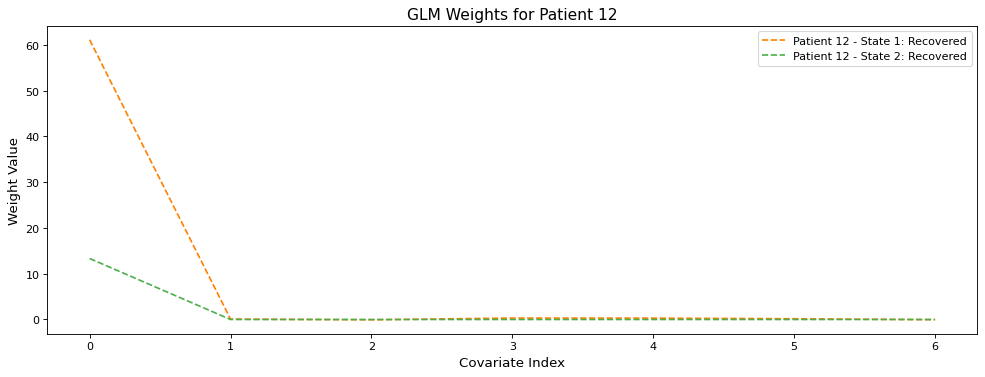

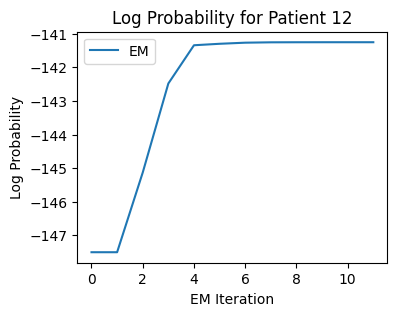

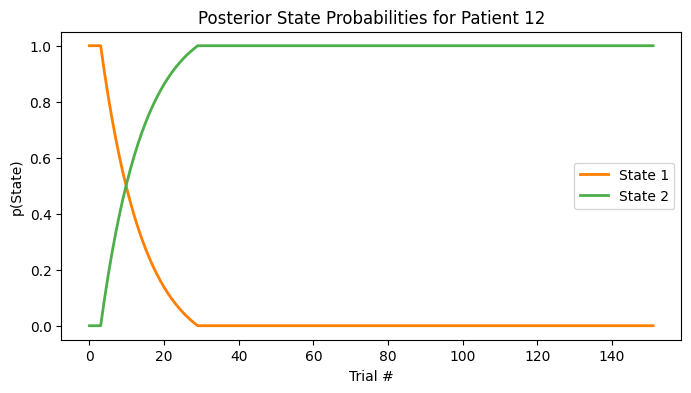

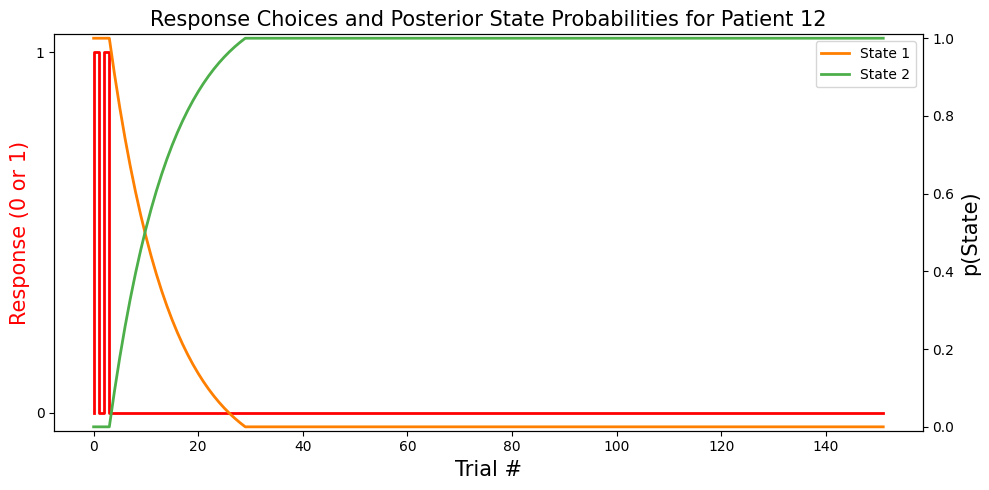

Processing patient 13


  0%|          | 0/1000 [00:00<?, ?it/s]

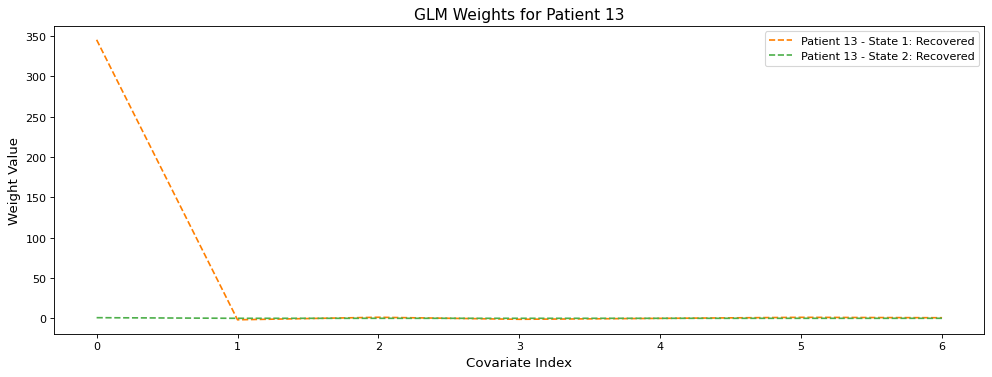

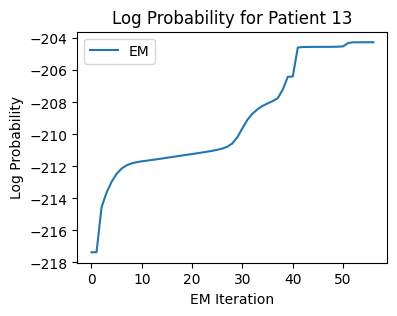

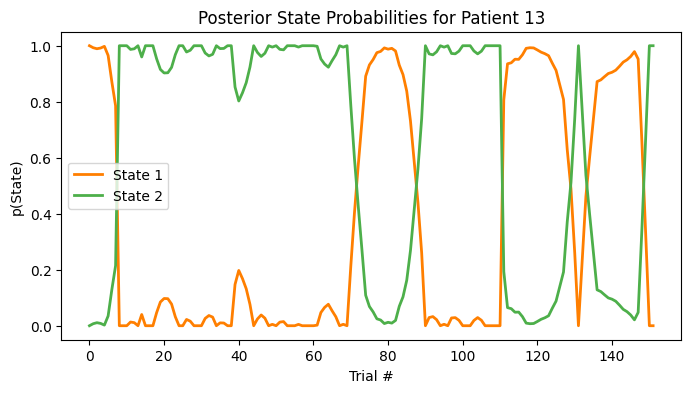

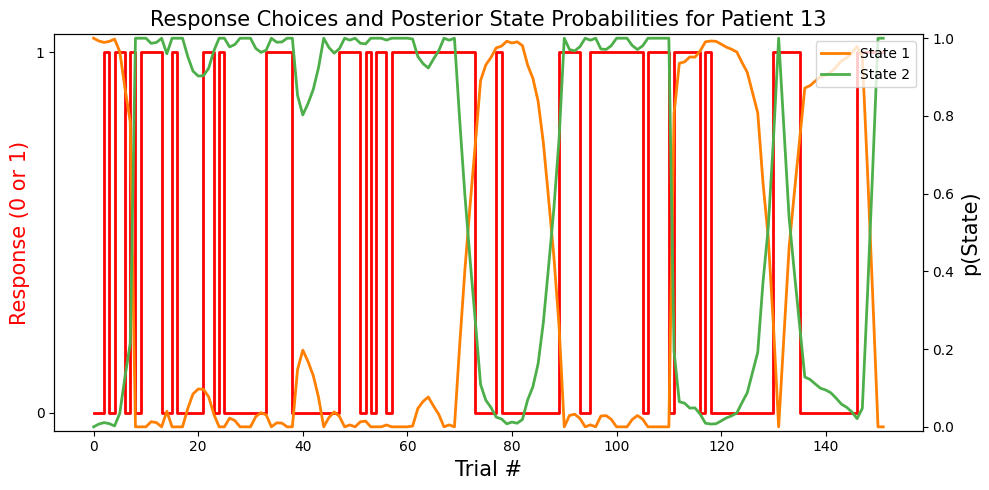

Processing patient 14


  0%|          | 0/1000 [00:00<?, ?it/s]

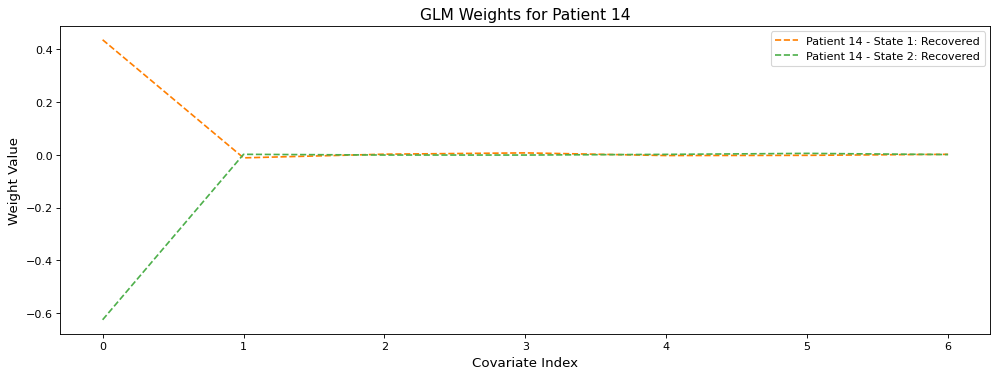

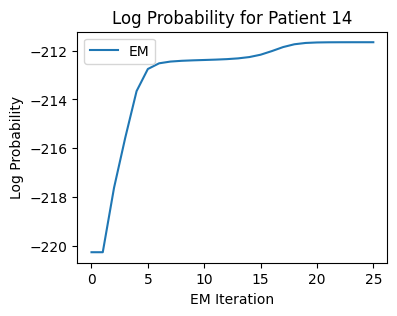

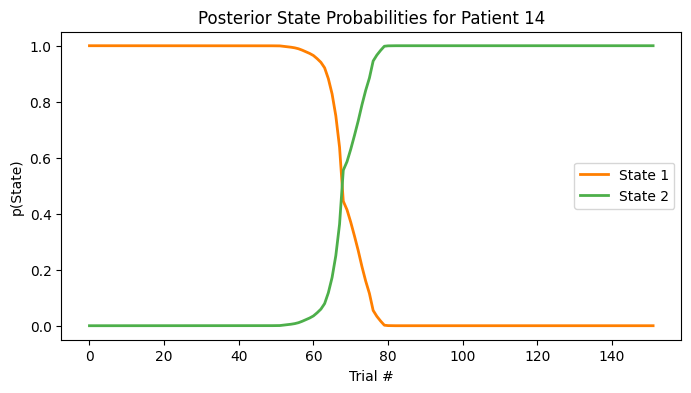

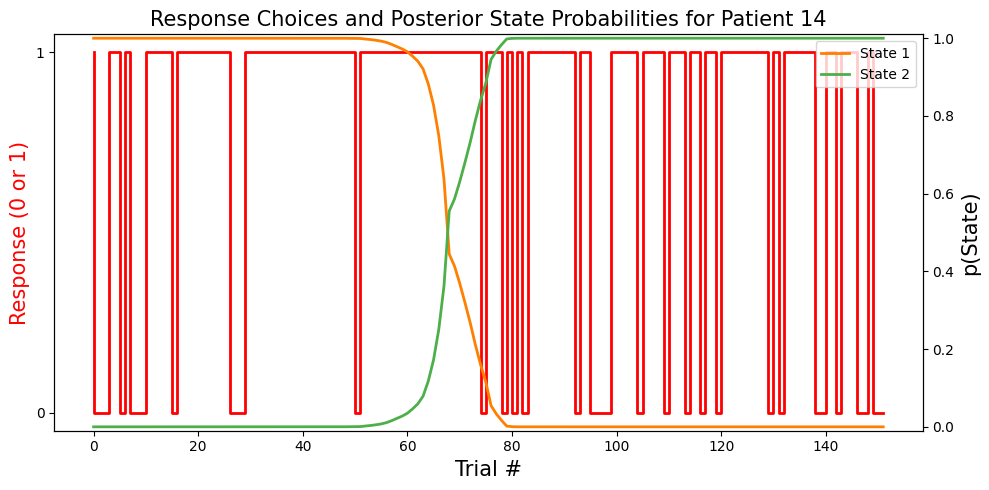

Processing patient 19


  0%|          | 0/1000 [00:00<?, ?it/s]

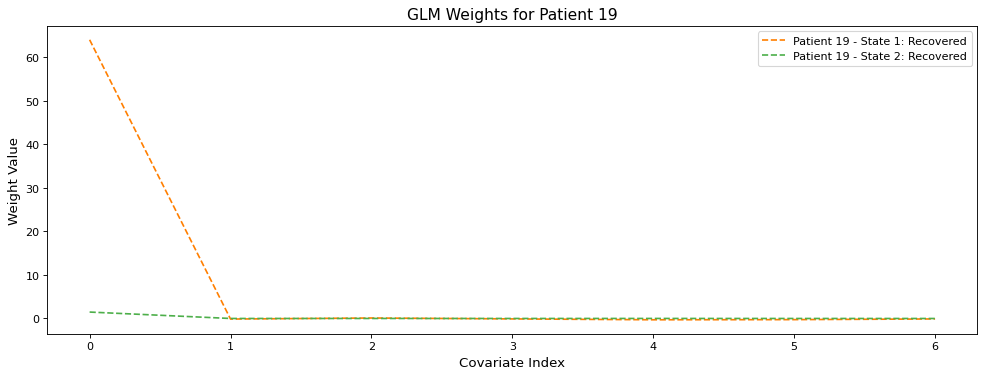

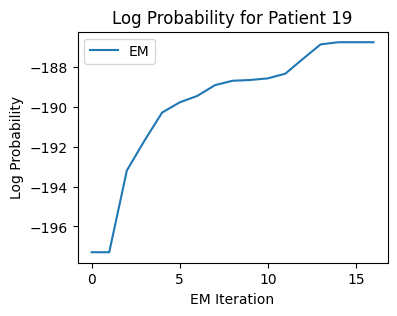

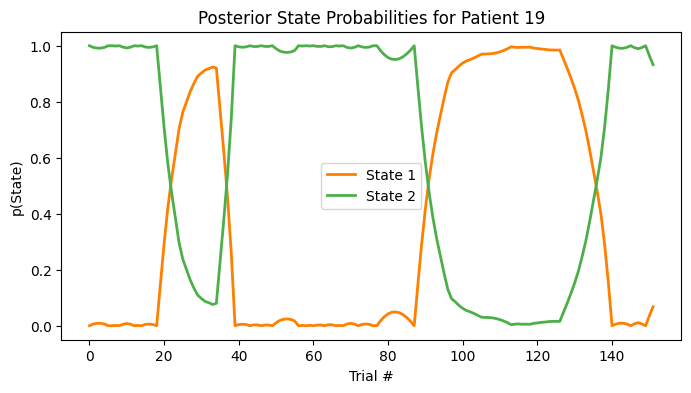

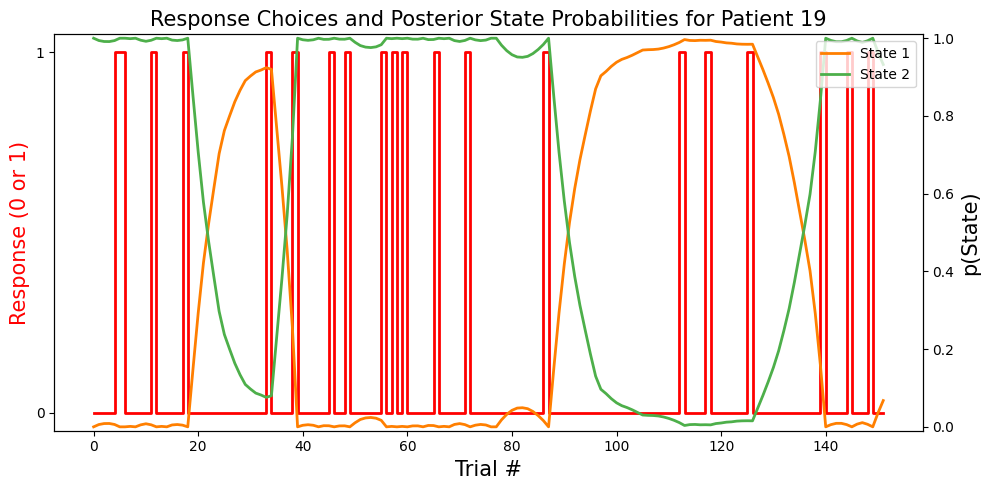

Processing patient 22


  0%|          | 0/1000 [00:00<?, ?it/s]

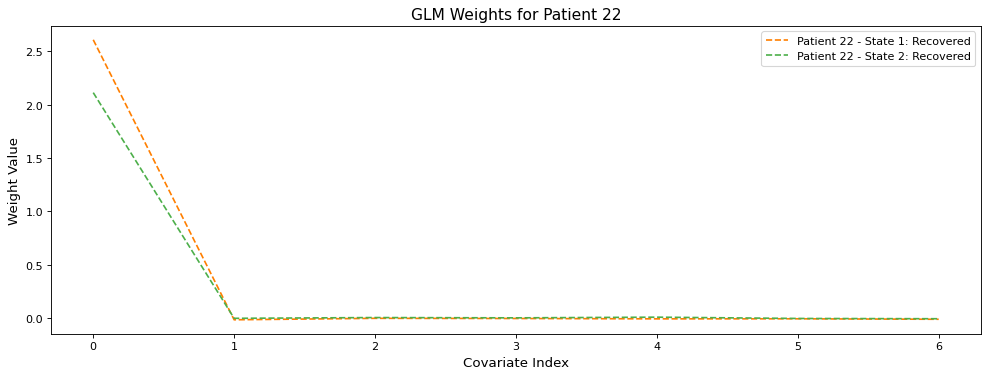

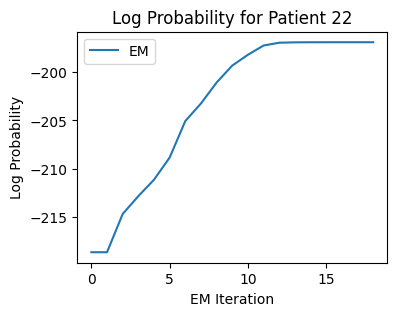

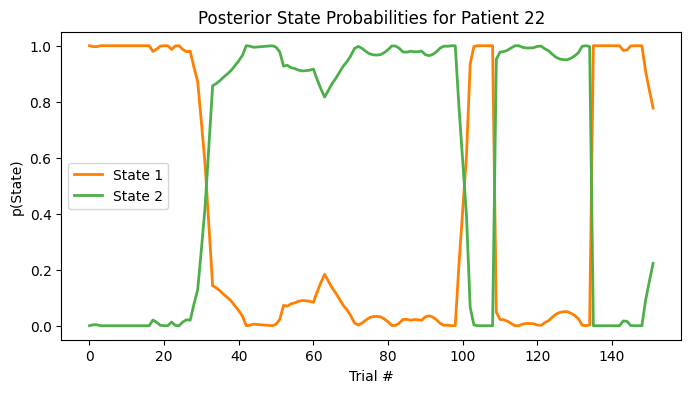

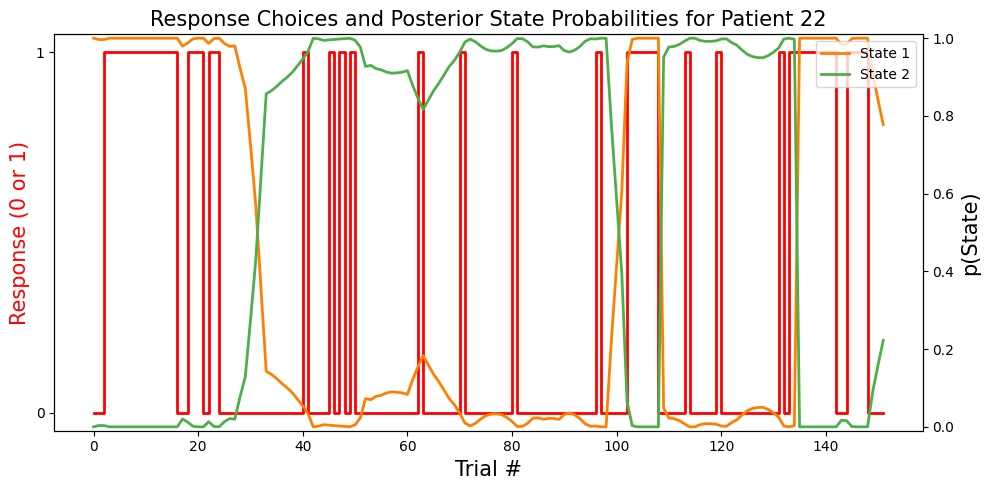

Processing patient 25


  0%|          | 0/1000 [00:00<?, ?it/s]

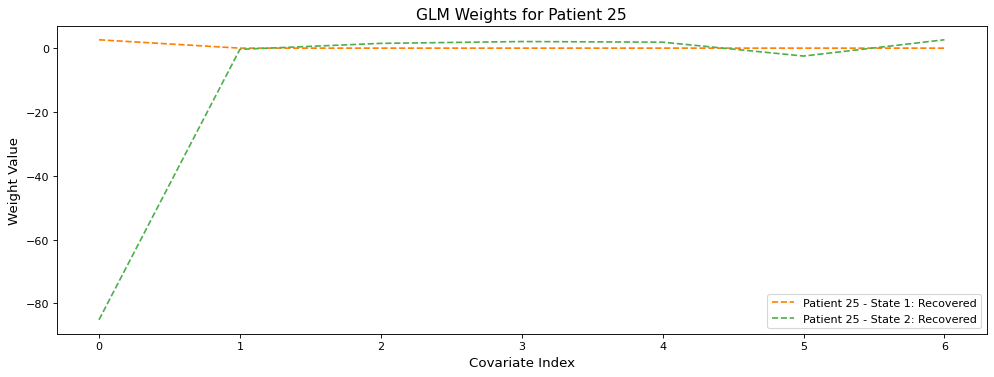

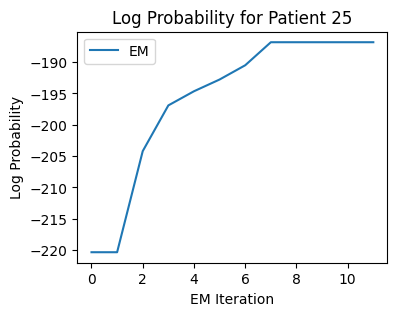

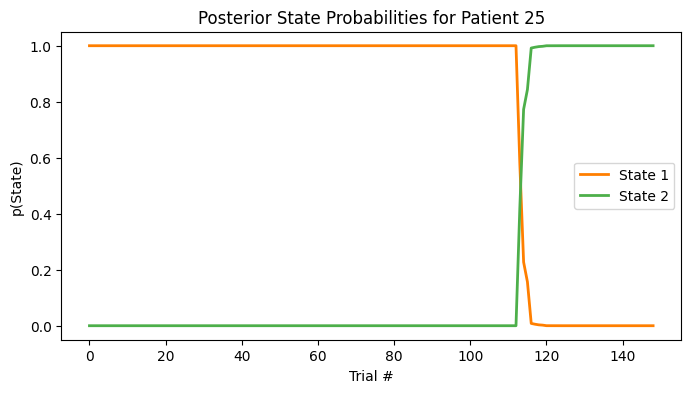

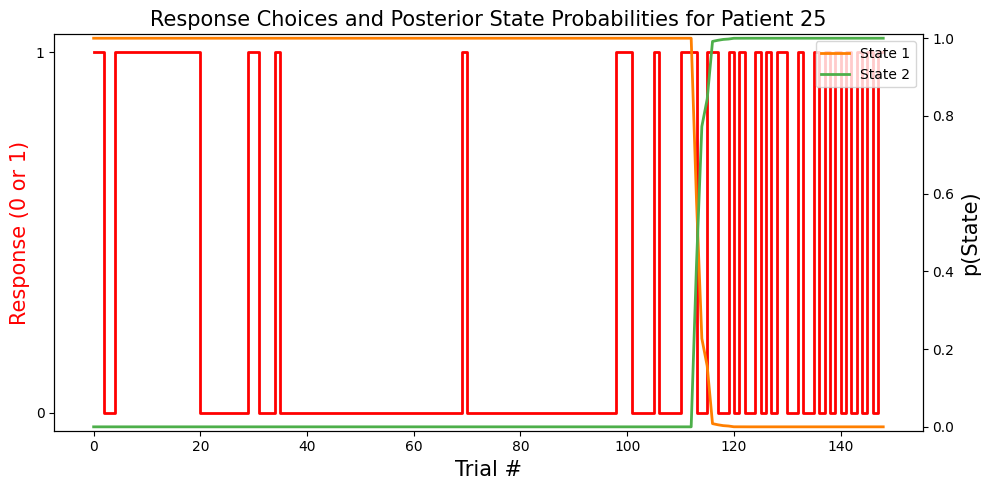

Processing patient 27


  0%|          | 0/1000 [00:00<?, ?it/s]

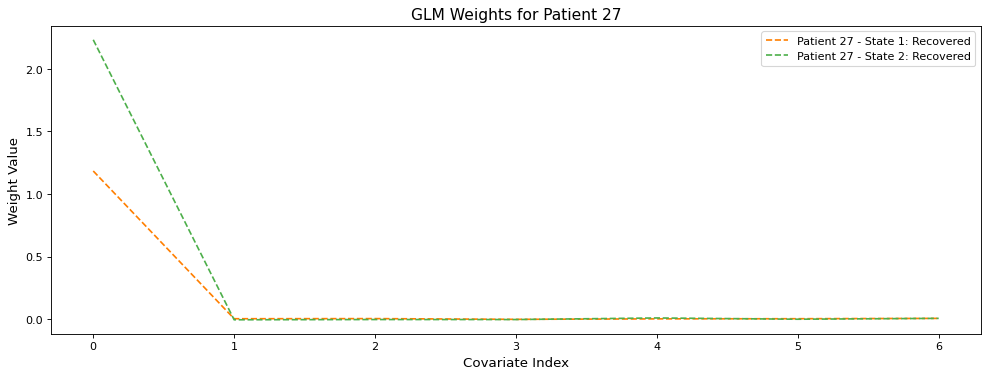

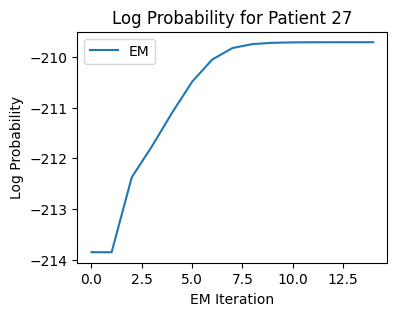

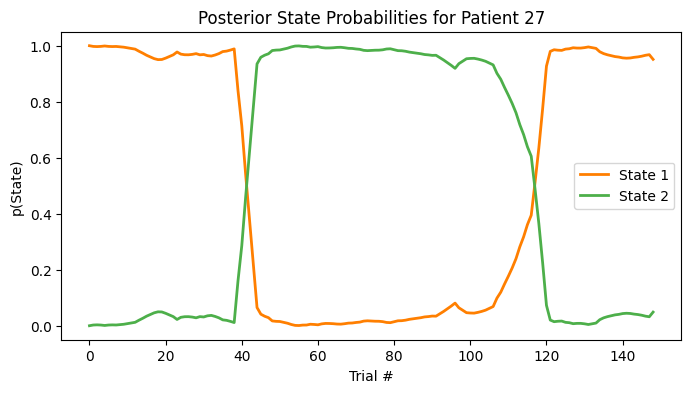

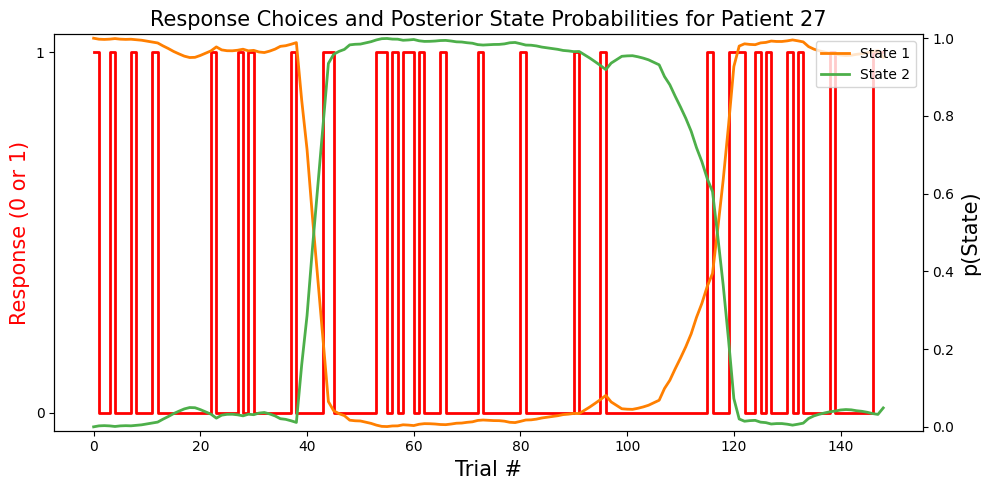

Processing patient 28


  0%|          | 0/1000 [00:00<?, ?it/s]

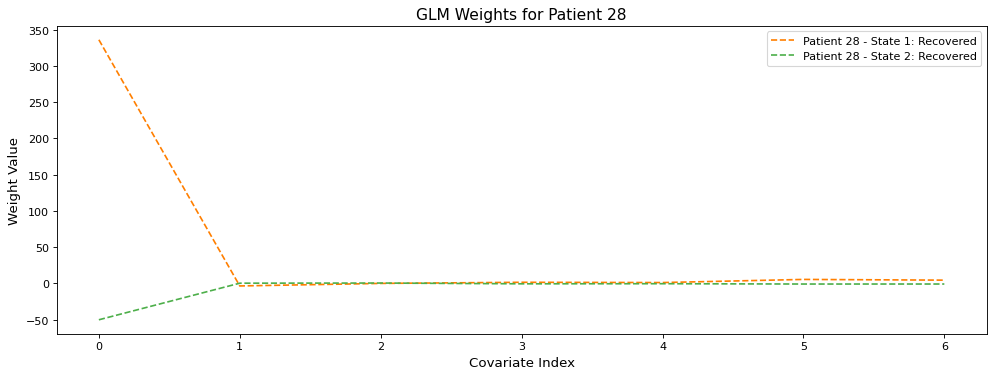

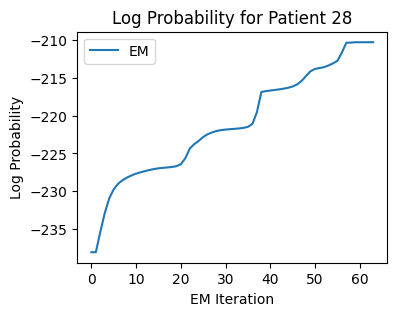

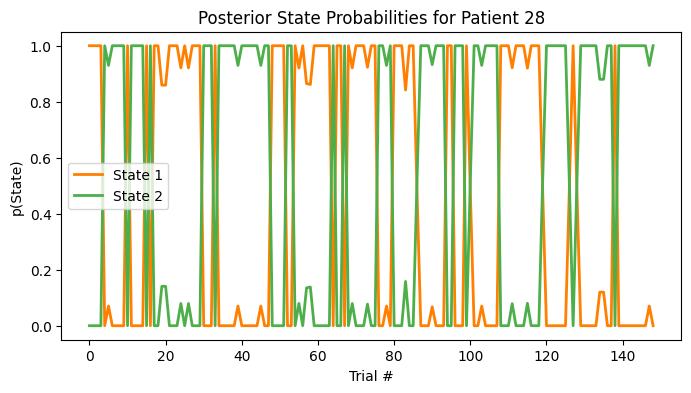

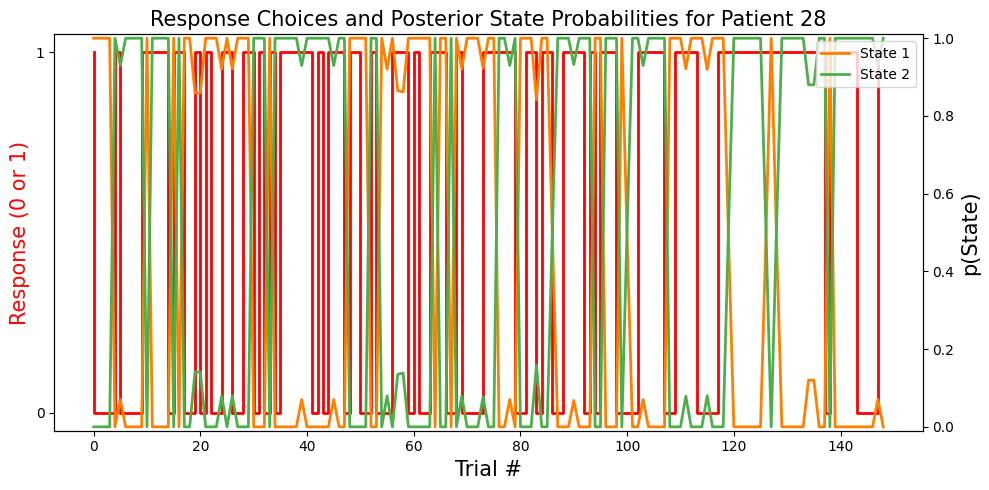

Processing patient 30


  0%|          | 0/1000 [00:00<?, ?it/s]

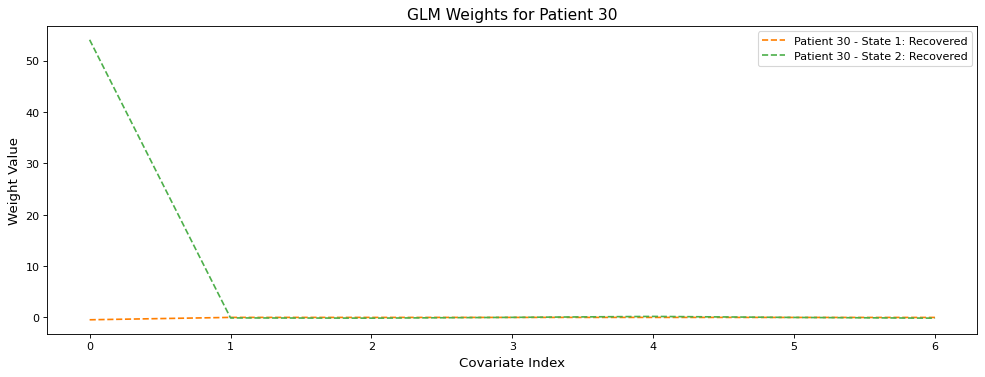

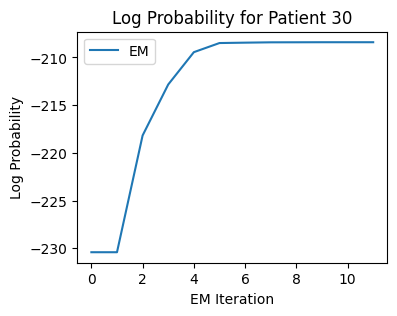

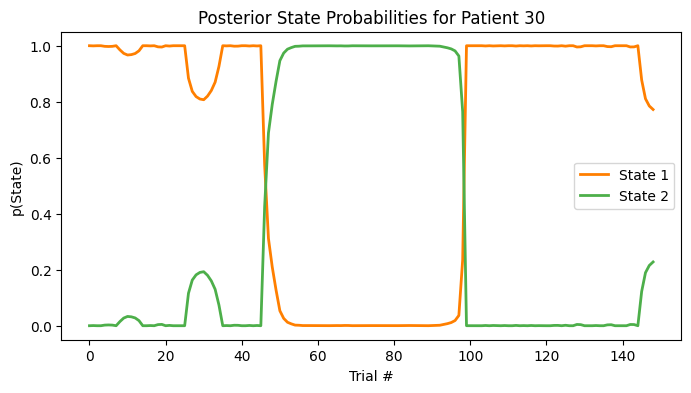

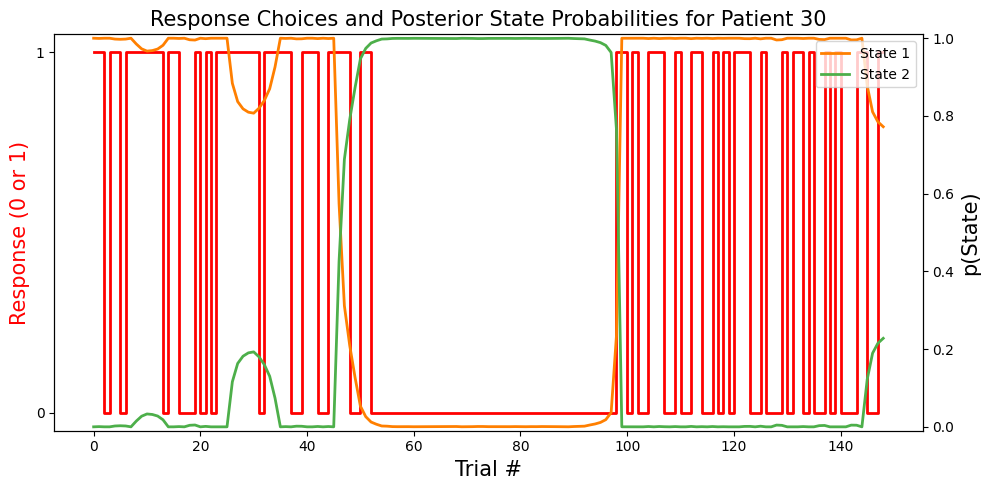

Processing patient 31


  0%|          | 0/1000 [00:00<?, ?it/s]

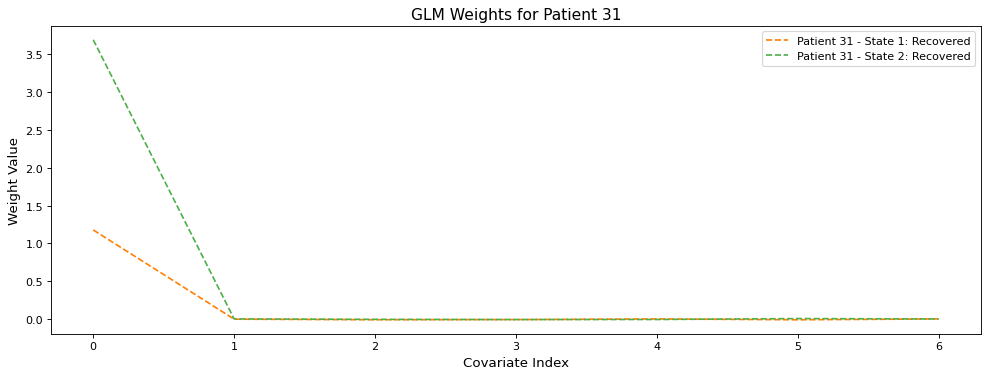

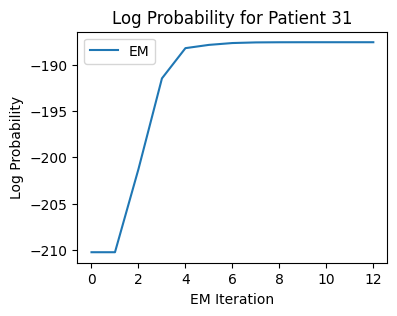

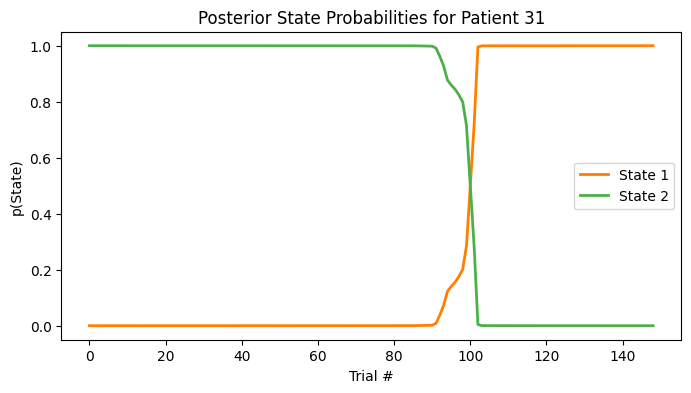

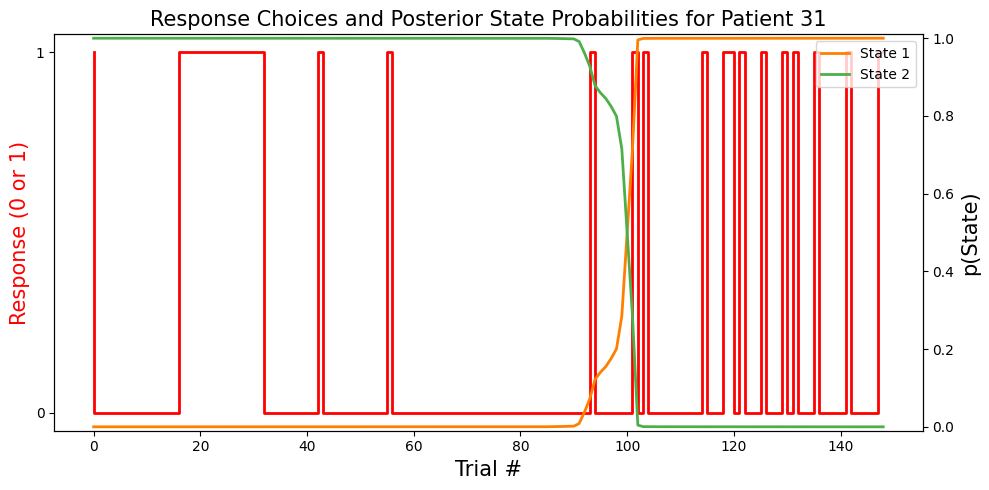

Processing patient 33


  0%|          | 0/1000 [00:00<?, ?it/s]

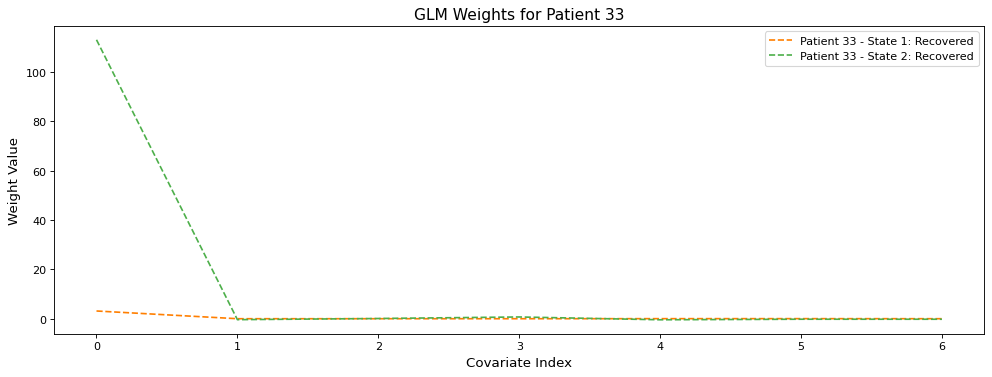

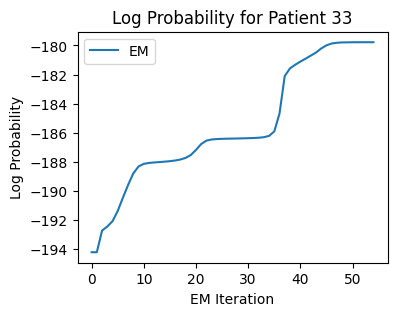

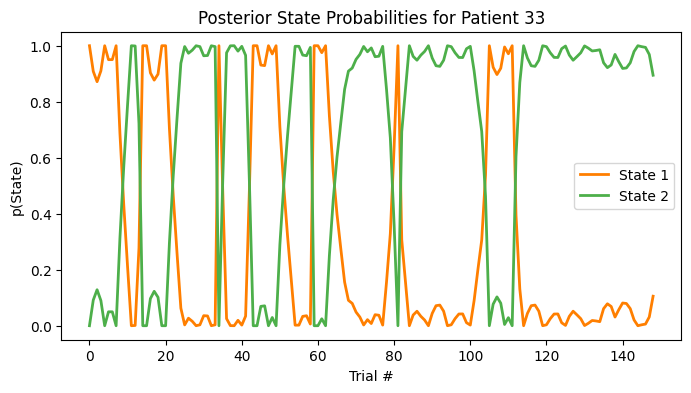

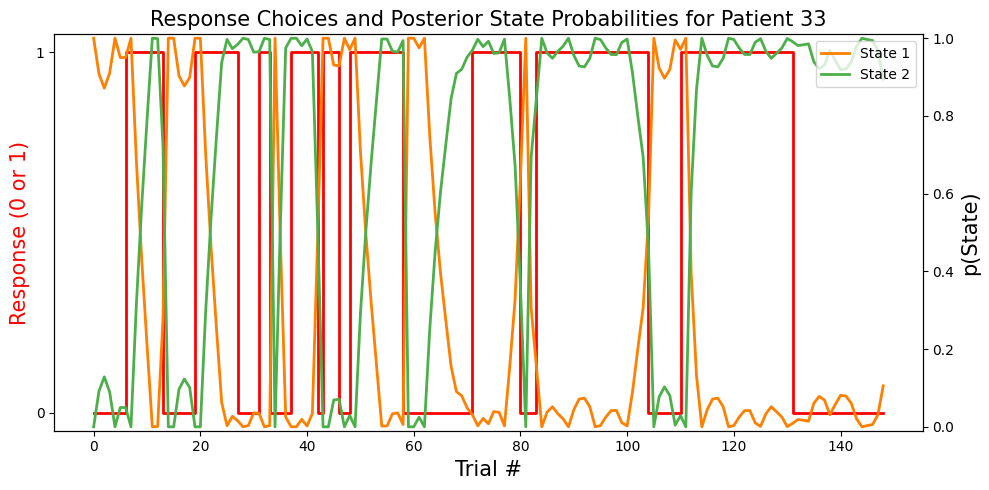

In [28]:
patients = [12, 13, 14, 19, 22, 25, 27, 28, 30, 31, 33]

# Define covariate columns and output column
covariate_columns = ['diff_pitch0', 'diff_pitch1', 'diff_pitch2', 'diff_pitch3', 
                     'diff_pitch4', 'diff_pitch5', 'diff_pitch6', 'choice_history']
output_column = 'response'

# Define colors for plotting states
cols = ['#ff7f00', '#4daf4a', '#377eb8']

# Iterate over each patient in the list
for subject_id in patients:
    print(f"Processing patient {subject_id}")
    
    # Filter data for the current patient
    subject_df = df_diff[df_diff['subject'] == subject_id]
    subject_df['choice_history'] = subject_df['response'].shift(1)
    subject_df = subject_df.dropna(subset=['choice_history'])
    
    # Prepare covariates and responses
    covariates = subject_df[covariate_columns].values
    bias_term = np.ones((covariates.shape[0], 1))  # Create a column of ones (bias term)
    covariates = np.hstack([bias_term, covariates])  # Concatenate bias term
    responses = subject_df[output_column].values.reshape(-1, 1)
    
    # Define and fit the GLM-HMM
    num_states = 2  # Number of discrete states
    obs_dim = 1  # Observed dimension (binary responses)
    num_categories = 2  # Number of categories for output (binary)
    input_dim = covariates.shape[1]  # Input dimension including bias term
    
    new_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs",
                         observation_kwargs=dict(C=num_categories), transitions="standard")
    
    # Fit the model
    N_iters = 1000  # Maximum number of EM iterations
    fit_ll = new_glmhmm.fit(responses, inputs=covariates, method="em", num_iters=N_iters, tolerance=10**-4)
    
    # Retrieve weights for plotting
    recovered_weights = new_glmhmm.observations.params
    fig = plt.figure(figsize=(15, 5), dpi=80, facecolor='w', edgecolor='k')

    # Plot recovered weights for each state
    for k in range(num_states):
        plt.plot(range(input_dim - 2), (recovered_weights[k][0])[:-2], color=cols[k],
                 lw=1.5, label=f"Patient {subject_id} - State {k + 1}: Recovered", linestyle='--')

    # Set plot labels and title
    plt.xlabel("Covariate Index", fontsize=12)
    plt.ylabel("Weight Value", fontsize=12)
    plt.title(f"GLM Weights for Patient {subject_id}", fontsize=14)
    plt.legend()
    plt.show()
    
    # Plot log probabilities during EM fitting
    plt.figure(figsize=(4, 3))
    plt.plot(fit_ll, label="EM")
    plt.xlabel("EM Iteration")
    plt.ylabel("Log Probability")
    plt.title(f"Log Probability for Patient {subject_id}")
    plt.legend()
    plt.show()
    
    # Plot posterior state probabilities
    posterior_probs = new_glmhmm.expected_states(data=responses, input=covariates)[0]
    plt.figure(figsize=(8, 4))
    for k in range(num_states):
        plt.plot(posterior_probs[:, k], label=f"State {k + 1}", lw=2, color=cols[k])
    plt.xlabel("Trial #")
    plt.ylabel("p(State)")
    plt.title(f"Posterior State Probabilities for Patient {subject_id}")
    plt.legend()
    plt.show()
    
    # Plot response choices and state probabilities
    fig, ax1 = plt.subplots(figsize=(10, 5))
    ax1.step(range(len(responses)), responses, color="red", lw=2)
    ax1.set_yticks([0, 1])
    ax1.set_xlabel("Trial #", fontsize=15)
    ax1.set_ylabel("Response (0 or 1)", fontsize=15, color="red")
    
    ax2 = ax1.twinx()
    for k in range(num_states):
        ax2.plot(range(len(responses)), posterior_probs[:, k], label=f"State {k + 1}", lw=2, color=cols[k])
    ax2.set_ylim((-0.01, 1.01))
    ax2.set_ylabel("p(State)", fontsize=15)
    
    # Combine the legends
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper right")
    
    plt.title(f"Response Choices and Posterior State Probabilities for Patient {subject_id}", fontsize=15)
    plt.tight_layout()
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

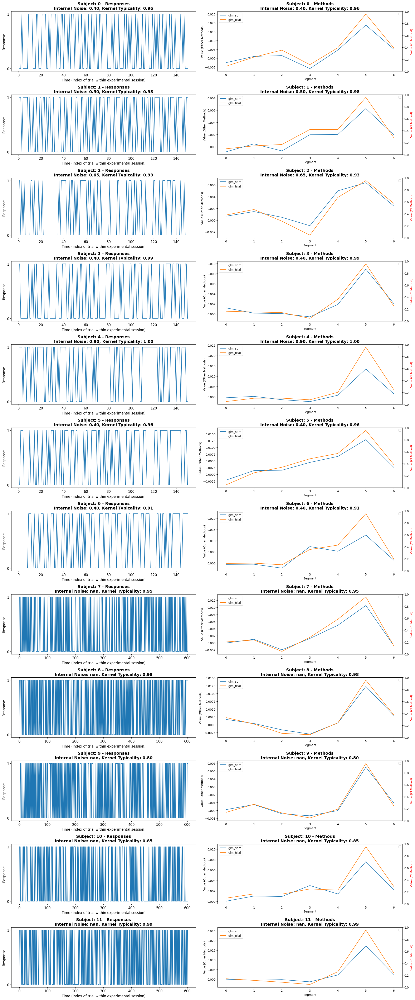

In [29]:
# Get the control sessions
control_sessions = revcor[(revcor.type == "controls") & (revcor.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

num_rows = len(control_sessions)

# Set up the figure to have two plots side by side for each subject
fig, axs = plt.subplots(num_rows, 2, figsize=(20, num_rows * 4))

for i, control_session in enumerate(zip(control_sessions.subject, control_sessions.session)):
    control = control_session[0]
    session = control_session[1]

    # Fetch the internal_noise_with_criteria and kernel_typicality values from revcor_measures dataframe for the control
    noise_value = revcor_measures[revcor_measures['subject'] == control]['internal_noise_with_criteria'].values[0]
    typicality_value = revcor_measures[revcor_measures['subject'] == control]['kernel_typicality'].values[0]

    # Filter the data for the current control and session for the response plot
    control_responses = revcor[(revcor.subject == control) & (revcor.session == session) & (revcor.stim_order == 0)].groupby('trial')['response'].first()

    # Plot the response for each session on the left subplot (axs[i, 0])
    axs[i, 0].plot(control_responses)
    axs[i, 0].set_yticks([0, 1])
    axs[i, 0].set_ylabel('Response', fontsize=12)
    axs[i, 0].set_xlabel('Time (index of trial within experimental session)', fontsize=12)
    axs[i, 0].grid(False)
    axs[i, 0].set_facecolor('white')
    axs[i, 0].tick_params(axis='both', which='major', labelsize=12)
    axs[i, 0].set_title(f'Subject: {control} - Responses\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

    # Filter data for the method plot
    subject_data = merged_df[merged_df['subject'] == control]
    subject_type = subject_data['type'].iloc[0]  # Get the subject's type

    # Plot methods that are not 'CI' on the primary y-axis (right subplot: axs[i, 1])
    non_ci_methods = subject_data[subject_data['method'] != 'CI']
    for method in non_ci_methods['method'].unique():
        data = non_ci_methods[non_ci_methods['method'] == method]
        axs[i, 1].plot(data['segment'], data['value'], label=method)

    # Create a secondary y-axis for the 'CI' method
    ax2 = axs[i, 1].twinx()
    ci_data = subject_data[subject_data['method'] == 'CI']
    if not ci_data.empty:
        ax2.plot(ci_data['segment'], ci_data['value'], label='CI', linestyle='--', color='r')

    axs[i, 1].set_xlabel('Segment')
    axs[i, 1].set_ylabel('Value (Other Methods)')
    ax2.set_ylabel('Value (CI Method)', color='r')
    axs[i, 1].legend(loc='upper left')
    ax2.legend(loc='upper right')
    axs[i, 1].set_title(f'Subject: {control} - Methods\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

# Adjust the layout to avoid overlap between subplots
plt.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

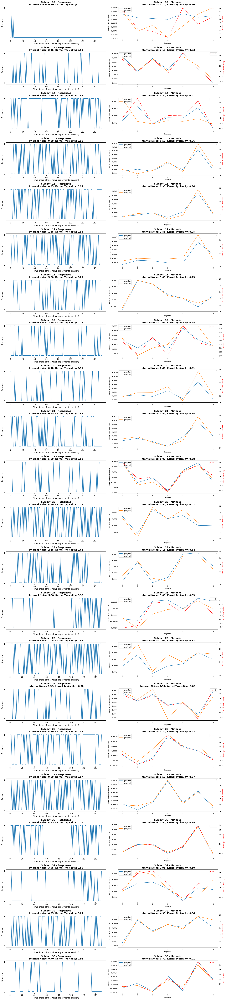

In [30]:
#patients = [12, 13, 14, 19, 22, 25, 27, 28, 30, 31, 33]

# Get the patient sessions
patient_sessions = revcor[(revcor.type == "patients") & (revcor.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

num_rows = len(patient_sessions)

# Set up the figure to have two plots side by side for each subject
fig, axs = plt.subplots(num_rows, 2, figsize=(20, num_rows * 4))

for i, patient_session in enumerate(zip(patient_sessions.subject, patient_sessions.session)):
    patient = patient_session[0]
    session = patient_session[1]

    # Fetch the internal_noise_with_criteria and kernel_typicality values from revcor_measures dataframe for the patient
    noise_value = revcor_measures[revcor_measures['subject'] == patient]['internal_noise_with_criteria'].values[0]
    typicality_value = revcor_measures[revcor_measures['subject'] == patient]['kernel_typicality'].values[0]

    # Filter the data for the current patient and session for the response plot
    patient_responses = revcor[(revcor.subject == patient) & (revcor.session == session) & (revcor.stim_order == 0)].groupby('trial')['response'].first()

    # Plot the response for each session on the left subplot (axs[i, 0])
    axs[i, 0].plot(patient_responses)
    axs[i, 0].set_yticks([0, 1])
    axs[i, 0].set_ylabel('Response', fontsize=12)
    axs[i, 0].set_xlabel('Time (index of trial within experimental session)', fontsize=12)
    axs[i, 0].grid(False)
    axs[i, 0].set_facecolor('white')
    axs[i, 0].tick_params(axis='both', which='major', labelsize=12)
    axs[i, 0].set_title(f'Subject: {patient} - Responses\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

    # Filter data for the method plot
    subject_data = merged_df[merged_df['subject'] == patient]
    subject_type = subject_data['type'].iloc[0]  # Get the subject's type

    # Plot methods that are not 'CI' on the primary y-axis (right subplot: axs[i, 1])
    non_ci_methods = subject_data[subject_data['method'] != 'CI']
    for method in non_ci_methods['method'].unique():
        data = non_ci_methods[non_ci_methods['method'] == method]
        axs[i, 1].plot(data['segment'], data['value'], label=method)

    # Create a secondary y-axis for the 'CI' method
    ax2 = axs[i, 1].twinx()
    ci_data = subject_data[subject_data['method'] == 'CI']
    if not ci_data.empty:
        ax2.plot(ci_data['segment'], ci_data['value'], label='CI', linestyle='--', color='r')

    axs[i, 1].set_xlabel('Segment')
    axs[i, 1].set_ylabel('Value (Other Methods)')
    ax2.set_ylabel('Value (CI Method)', color='r')
    axs[i, 1].legend(loc='upper left')
    ax2.legend(loc='upper right')
    axs[i, 1].set_title(f'Subject: {patient} - Methods\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

# Adjust the layout to avoid overlap between subplots
plt.tight_layout()
plt.show()

In [44]:
subject_id = 18
subject_df = df_diff[df_diff['subject'] == subject_id]
subject_df['choice_history'] = subject_df['response'].shift(1)
subject_df = subject_df.dropna(subset=['choice_history'])
subject_df

,subject,block,trial,session,diff_pitch0,diff_pitch1,diff_pitch2,diff_pitch3,diff_pitch4,diff_pitch5,diff_pitch6,type,response,choice_history
4969,18,0,1,1,-110.553627,-12.121443,-71.450120,42.499607,-90.886455,-77.840718,-48.433714,patients,1,1.0
4970,18,0,2,1,34.427872,112.378434,0.824791,-232.104433,48.653853,-11.933221,124.174578,patients,1,1.0
4971,18,1,3,1,-104.968722,-0.321213,86.387369,-46.543953,-127.411397,212.400906,94.234348,patients,1,1.0
4972,18,1,4,1,-54.655813,-249.971886,-102.001162,181.167480,-153.986126,209.831070,-107.204818,patients,1,1.0
4973,18,1,5,1,34.081369,-39.369065,-60.375959,0.018810,-151.696393,73.059468,62.677857,patients,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5116,18,3,148,1,-49.127296,-71.289644,-179.032417,261.059252,-108.031344,60.719083,-18.345147,patients,1,1.0
5117,18,3,149,1,46.455693,175.157098,-65.693479,63.104982,56.431482,-131.079985,-118.907167,patients,1,1.0
5118,18,3,150,1,-97.500843,-38.010309,74.327156,75.941375,76.159629,72.066508,29.734008,patients,0,1.0
5119,18,3,151,1,202.672033,-181.516332,-33.040119,-93.685645,94.694970,34.543371,-137.261551,patients,0,0.0


In [90]:
covariate_columns = ['diff_pitch0', 'diff_pitch1', 'diff_pitch2', 'diff_pitch3', 
                     'diff_pitch4', 'diff_pitch5', 'diff_pitch6','choice_history']

output_column = 'response'

covariates = subject_df[covariate_columns].values
#bias_term = np.ones((covariates.shape[0], 1))  # Create a column of ones

# Concatenate the bias term to the covariates
#covariates = np.hstack([bias_term, covariates])
responses = subject_df[output_column].values.reshape(-1, 1) 

In [91]:
print("Shape of responses:", responses.shape)
print("Shape of covariates:", covariates.shape)

Shape of responses: (149, 1)
Shape of covariates: (149, 8)


## 2. Input Driven Observations


In [92]:
glm = ssm.HMM(1, 1, 8, observations="input_driven_obs", 
                   observation_kwargs=dict(C=2), transitions="standard")
print(glm.observations.params)
print(glm.transitions.params)
ll_glm=glm.fit(responses, inputs=covariates, method="em", num_iters=100, tolerance=10**-3)

[[[ 1.84369153  1.52550724 -1.44553558  0.37716061 -0.07055723
    0.60415971  0.472149    0.81991729]]]
(array([[0.]]),)


  0%|          | 0/100 [00:00<?, ?it/s]

## 3. Fit GLM-HMM and perform recovery analysis

## 3a. Maximum Likelihood Estimation

In [93]:
npr.seed(0)
# Set the parameters of the GLM-HMM
num_states = 2        # number of discrete states
obs_dim = 1           # number of observed dimensions
num_categories = 2    # number of categories for output
input_dim = 8         # input dimensions

In [94]:
new_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs", 
                   observation_kwargs=dict(C=num_categories), transitions="standard")
N_iters = 1000 # maximum number of EM iterations. Fitting with stop earlier if increase in LL is below tolerance specified by tolerance parameter
fit_ll = new_glmhmm.fit(responses, inputs=covariates, method="em", num_iters=N_iters, tolerance=10**-4)

  0%|          | 0/1000 [00:00<?, ?it/s]

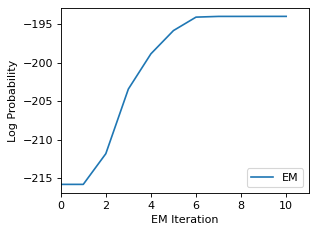

In [95]:
# Plot the log probabilities of the true and fit models. Fit model final LL should be greater 
# than or equal to true LL.
fig = plt.figure(figsize=(4, 3), dpi=80, facecolor='w', edgecolor='k')
plt.plot(fit_ll, label="EM")
#plt.plot([0, len(fit_ll)], true_ll * np.ones(2), ':k', label="True")
plt.legend(loc="lower right")
plt.xlabel("EM Iteration")
plt.xlim(0, len(fit_ll))
plt.ylabel("Log Probability")
plt.show()

In [99]:
recovered_weights = new_glmhmm.observations.params

recovered_weights_1 = new_glmhmm.observations.params[0]  
recovered_weights_2 = new_glmhmm.observations.params[1] 

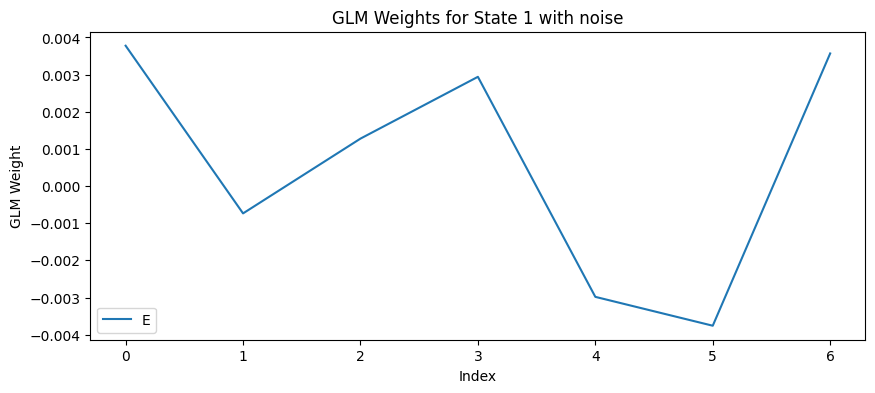

In [101]:

plt.figure(figsize=(10, 4))
for i in range(recovered_weights_2.shape[0]):
    plt.plot(recovered_weights_1[i][:-1], label=f'Row {i}')
plt.xlabel('Index')
plt.ylabel('GLM Weight')
plt.title('GLM Weights for State 1 with noise')
plt.legend('ENG')
plt.show()

### 3b. Retrieved parameters

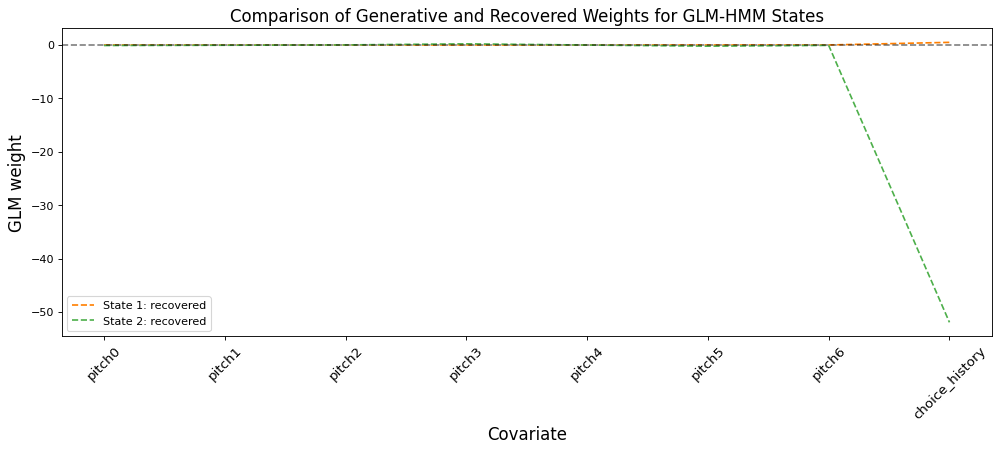

In [102]:
import matplotlib.pyplot as plt

# Set figure size and DPI for clarity
fig = plt.figure(figsize=(15, 5), dpi=80, facecolor='w', edgecolor='k')

# Define colors for each state
cols = ['#ff7f00', '#4daf4a', '#377eb8','#984ea3']  # Orange, Green, Blue for states

# Retrieve recovered weights from the GLM-HMM model
recovered_weights = new_glmhmm.observations.params

# Loop through the number of states and plot both generative and recovered weights
for k in range(num_states):
    # Plot the recovered weights for each state
    plt.plot(range(input_dim), (recovered_weights[k][0])[:], color=cols[k],
             lw=1.5, label=f"State {k+1}: recovered", linestyle='--')

# Set y-axis ticks font size
plt.yticks(fontsize=10)

# Add labels for the axes
plt.ylabel("GLM weight", fontsize=15)
plt.xlabel("Covariate", fontsize=15)

# Add horizontal line at y=0 to visualize where the weights cross zero
plt.axhline(y=0, color="k", alpha=0.5, ls="--")

# Add labels for covariates, modify according to the number of covariates in your data
plt.xticks(range(input_dim), ['pitch0', 'pitch1', 'pitch2', 'pitch3', 'pitch4', 'pitch5', 'pitch6','choice_history'], 
           fontsize=12, rotation=45)

# Add a legend to differentiate between generative and recovered weights for each state
plt.legend()

# Set the title for the plot
plt.title("Comparison of Generative and Recovered Weights for GLM-HMM States", fontsize=15)

# Display the plot
plt.show()


Text(0.5, 1.0, 'recovered')

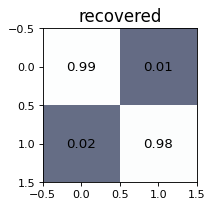

In [103]:
fig = plt.figure(figsize=(5, 2.5), dpi=80, facecolor='w', edgecolor='k')

recovered_trans_mat = np.exp(new_glmhmm.transitions.log_Ps)
plt.imshow(recovered_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(recovered_trans_mat.shape[0]):
    for j in range(recovered_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(recovered_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
#plt.xticks(range(0, num_states), ('1', '2','3'), fontsize=10)
#plt.yticks(range(0, num_states), ('1', '2','3'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.title("recovered", fontsize = 15)


Text(0, 0.5, 'observation class')

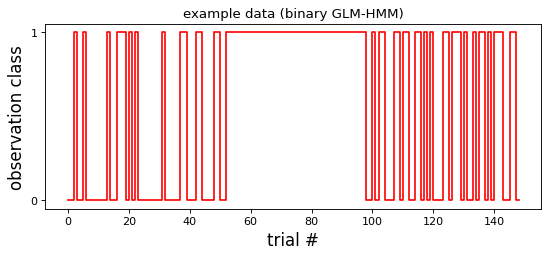

In [104]:
# plot example data:
fig = plt.figure(figsize=(8, 3), dpi=80, facecolor='w', edgecolor='k')
plt.step(range(149),responses[range(149)], color = "red")
plt.yticks([0, 1])
plt.title("example data (binary GLM-HMM)")
plt.xlabel("trial #", fontsize = 15)
plt.ylabel("observation class", fontsize = 15)

### 3c. Posterior State Probabilities

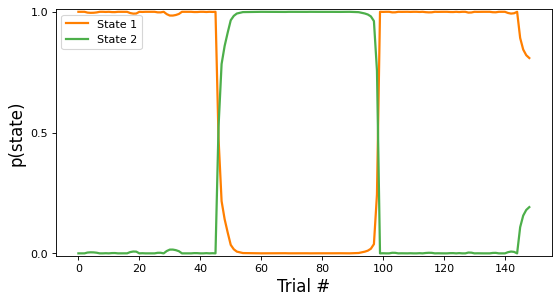

In [105]:
fig = plt.figure(figsize=(8, 4), dpi=80, facecolor='w', edgecolor='k')
posterior_probs = new_glmhmm.expected_states(data=responses, input=covariates)[0]

# Iterate through states and plot posterior probabilities
num_states = posterior_probs.shape[1]  # Assuming posterior_probs is (n_trials, num_states)

for k in range(num_states):
    plt.plot(posterior_probs[:, k], label="State " + str(k + 1), lw=2, color=cols[k])

# Set plot limits and labels
plt.ylim((-0.01, 1.01))
plt.yticks([0, 0.5, 1], fontsize=10)
plt.xlabel("Trial #", fontsize=15)
plt.ylabel("p(state)", fontsize=15)

# Add legend to distinguish between states
plt.legend()

# Show plot
plt.show()

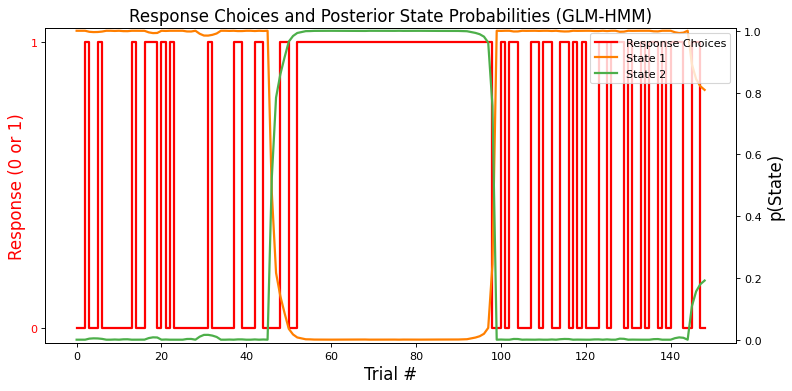

In [106]:
cols = ['#ff7f00', '#4daf4a', '#377eb8','#984ea3']

# Create a figure with dual y-axes
fig, ax1 = plt.subplots(figsize=(10, 5), dpi=80, facecolor='w', edgecolor='k')

# Plot the response choices (0 or 1) on the first y-axis (ax1)
ax1.step(range(len(responses)), responses, color="red", label="Response Choices", lw=2)
ax1.set_yticks([0, 1])
ax1.set_title("Response Choices and Posterior State Probabilities (GLM-HMM)", fontsize=15)
ax1.set_xlabel("Trial #", fontsize=15)
ax1.set_ylabel("Response (0 or 1)", fontsize=15, color="red")
ax1.tick_params(axis='y', labelcolor="red")

# Create a second y-axis (ax2) to plot the posterior state probabilities
ax2 = ax1.twinx()
for k in range(num_states):
    ax2.plot(range(len(responses)), posterior_probs[:, k], label="State " + str(k + 1), lw=2, color=cols[k])

# Adjust limits and labels for the second axis
ax2.set_ylim((-0.01, 1.01))
ax2.set_ylabel("p(State)", fontsize=15)
ax2.tick_params(axis='y')

# Add combined legend for response choices and state probabilities
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper right")

# Show the plot
plt.tight_layout()
plt.show()

In [107]:
inferred_states = new_glmhmm.most_likely_states(responses, input=covariates)
inferred_states

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

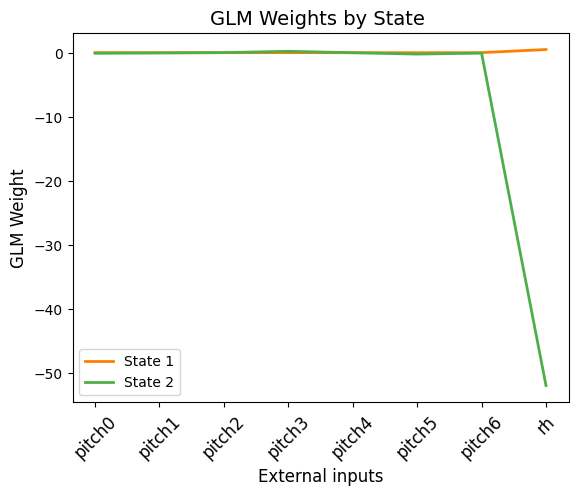

In [108]:
weights = new_glmhmm.observations.params  # This contains GLM weights for each state

# Automatically exclude the last value from each state's GLM weights
weights_excluded_last = [weight[:,:] for weight in weights]

# Plot the weights for each state with the specified colors
for state, weight in enumerate(weights_excluded_last):
    plt.plot(weight[0], label=f'State {state + 1}', color=cols[state], lw=2)  # Plot without the last value
plt.xticks(range(input_dim), ['pitch0', 'pitch1', 'pitch2', 'pitch3', 'pitch4', 'pitch5', 'pitch6','rh'], 
           fontsize=12, rotation=45)
# Add labels and title to the plot
plt.xlabel('External inputs', fontsize=12)
plt.ylabel('GLM Weight', fontsize=12)
plt.title('GLM Weights by State ', fontsize=14)
plt.legend()
plt.show()

In [109]:
# concatenate posterior probabilities across sessions
posterior_probs_concat = np.concatenate(posterior_probs)
# get state with maximum posterior probability at particular trial:
state_max_posterior = np.argmax(posterior_probs_concat)
# now obtain state fractional occupancies:
_, state_occupancies = np.unique(state_max_posterior, return_counts=True)
state_occupancies = state_occupancies/np.sum(state_occupancies)

Text(0, 0.5, 'frac. occupancy')

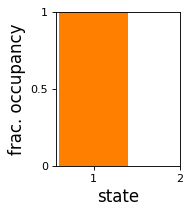

In [110]:
fig = plt.figure(figsize=(2, 2.5), dpi=80, facecolor='w', edgecolor='k')
for z, occ in enumerate(state_occupancies):
    plt.bar(z, occ, width = 0.8, color = cols[z])
plt.ylim((0, 1))
plt.xticks([0, 1], ['1', '2'], fontsize = 10)
plt.yticks([0, 0.5, 1], ['0', '0.5', '1'], fontsize=10)
plt.xlabel('state', fontsize = 15)
plt.ylabel('frac. occupancy', fontsize=15)

## Residuals

In [686]:
def sigmoid(x):
    """ Sigmoid function for converting GLM linear prediction into probability """
    return 1 / (1 + np.exp(-x))

def get_predicted_responses(glmhmm, covariates, posterior_probs):
    """ Get predicted responses based on GLM-HMM fitting """
    predicted_responses = []
    weights = glmhmm.observations.params
    
    # Get the state with the highest posterior probability for each trial
    max_posterior_states = np.argmax(posterior_probs, axis=1)
    
    for i, state in enumerate(max_posterior_states):
        # Linear prediction using GLM weights
        linear_pred = np.dot(covariates[i], weights[state][0])
        
        # Convert to predicted probability (logistic regression)
        predicted_prob = sigmoid(linear_pred)
        
        # Convert probability to binary response (0 or 1)
        predicted_responses.append(predicted_prob)
    
    return np.array(predicted_responses)

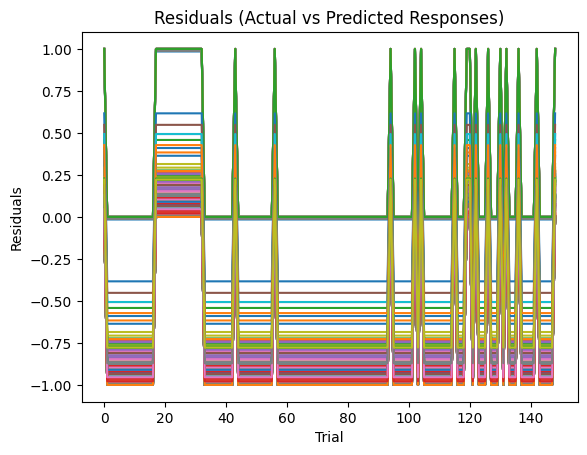

In [687]:
def calculate_residuals(actual_responses, predicted_responses):
    """ Calculate residuals (difference between actual and predicted responses) """
    residuals = actual_responses - predicted_responses
    return residuals

# Example: Get residuals for one block of trials
predicted_responses = get_predicted_responses(new_glmhmm, covariates, posterior_probs)
residuals = calculate_residuals(responses, predicted_responses)

# Plot the residuals
plt.plot(residuals)
plt.xlabel('Trial')
plt.ylabel('Residuals')
plt.title('Residuals (Actual vs Predicted Responses)')
plt.show()

In [688]:
noise_std = np.std(residuals)
print(f"Estimated noise (standard deviation of residuals): {noise_std}")


Estimated noise (standard deviation of residuals): 0.5141203216390459


##  Cross Validation ML

To assess which model is better - the model fit via Maximum Likelihood Estimation and how many number of states or inputs or iterations we can investigate the predictive power of these fit models on held-out test data sets.

Fitting for 1 states


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Average log-likelihood for 1 states: -91.96399506069069
Fitting for 2 states


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Average log-likelihood for 2 states: -163.97034688950006
Fitting for 3 states


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Average log-likelihood for 3 states: -293.42387756636737
Fitting for 4 states


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Average log-likelihood for 4 states: -406.63255756119844
Fitting for 5 states


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Average log-likelihood for 5 states: -439.205963264107


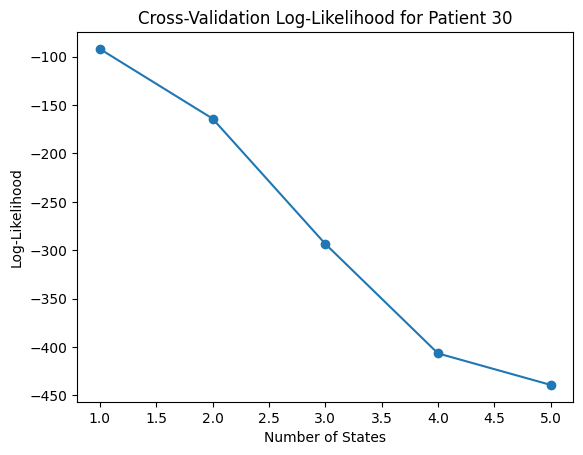

In [1070]:
from sklearn.model_selection import KFold

subject_id = 30
subject_df = df_diff[df_diff['subject'] == subject_id]
subject_df['choice_history'] = subject_df['response'].shift(1)
subject_df = subject_df.dropna(subset=['choice_history'])

# Define covariate columns and output column
covariate_columns = ['diff_pitch0', 'diff_pitch1', 'diff_pitch2', 'diff_pitch3', 
                     'diff_pitch4', 'diff_pitch5', 'diff_pitch6', 'choice_history']
output_column = 'response'

# Prepare covariates and responses
covariates = subject_df[covariate_columns].values
bias_term = np.ones((covariates.shape[0], 1))  # Add a bias term
covariates = np.hstack([bias_term, covariates])  # Concatenate the bias term
responses = subject_df[output_column].values.reshape(-1, 1)

# Define parameters for cross-validation
max_states = 5  # Test up to 5 states
kf = KFold(n_splits=5)  # 5-fold cross-validation

# Store log-likelihoods for different numbers of states
log_likelihoods = []

# Loop through different numbers of states
for num_states in range(1, max_states + 1):
    fold_lls = []  # Store log-likelihood for each fold
    print(f"Fitting for {num_states} states")
    
    for train_index, test_index in kf.split(covariates):
        # Split into training and test sets for cross-validation
        covariates_train, covariates_test = covariates[train_index], covariates[test_index]
        responses_train, responses_test = responses[train_index], responses[test_index]

        # Define GLM-HMM model for the current number of states
        obs_dim = 1  # Binary responses
        input_dim = covariates_train.shape[1]  # Including bias term
        num_categories = 2  # Binary output

        glm_hmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs",
                          observation_kwargs=dict(C=num_categories), transitions="standard")

        # Fit the model
        glm_hmm.fit(responses_train, inputs=covariates_train, method="em", num_iters=1000, tolerance=10**-4)
        
        # Calculate log-likelihood on the test set
        fold_ll = glm_hmm.log_probability(responses_test, inputs=covariates_test)
        fold_lls.append(fold_ll)
    
    # Average log-likelihood over the cross-validation folds
    avg_ll = np.mean(fold_lls)
    log_likelihoods.append(avg_ll)
    print(f"Average log-likelihood for {num_states} states: {avg_ll}")

# Plot the log-likelihood for different numbers of states
plt.plot(range(1, max_states + 1), log_likelihoods, marker='o')
plt.xlabel('Number of States')
plt.ylabel('Log-Likelihood')
plt.title(f'Cross-Validation Log-Likelihood for Patient {subject_id}')
plt.show()

In [ ]:
# Create additional input sequences to be used as held-out test data
num_test_sess = 10
test_inpts = np.ones((num_test_sess, num_trials_per_sess, input_dim)) 
test_inpts[:,:,0] = np.random.choice(stim_vals, (num_test_sess, num_trials_per_sess)) 
test_inpts = list(test_inpts)

In [ ]:
# Create set of test latents and choices to accompany input sequences:
test_latents, test_choices = [], []
for sess in range(num_test_sess):
    test_z, test_y = true_glmhmm.sample(num_trials_per_sess, input=test_inpts[sess])
    test_latents.append(test_z)
    test_choices.append(test_y)

In [ ]:
# Compare likelihood of test_choices for model fit with MLE with varied parameters:
mle_test_ll = new_glmhmm.log_likelihood(test_choices, inputs=test_inpts) 

Text(0, 0.5, 'loglikelihood')

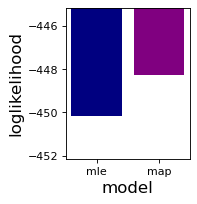

In [ ]:
fig = plt.figure(figsize=(2, 2.5), dpi=80, facecolor='w', edgecolor='k')
loglikelihood_vals = [mle_test_ll, map_test_ll]
colors = ['Purple']
for z, occ in enumerate(loglikelihood_vals):
    plt.bar(z, occ, width = 0.8, color = colors[z])
plt.ylim((mle_test_ll-2, mle_test_ll+5))
plt.xticks([0], ['mle'], fontsize = 10)
plt.xlabel('model', fontsize = 15)
plt.ylabel('loglikelihood', fontsize=15)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

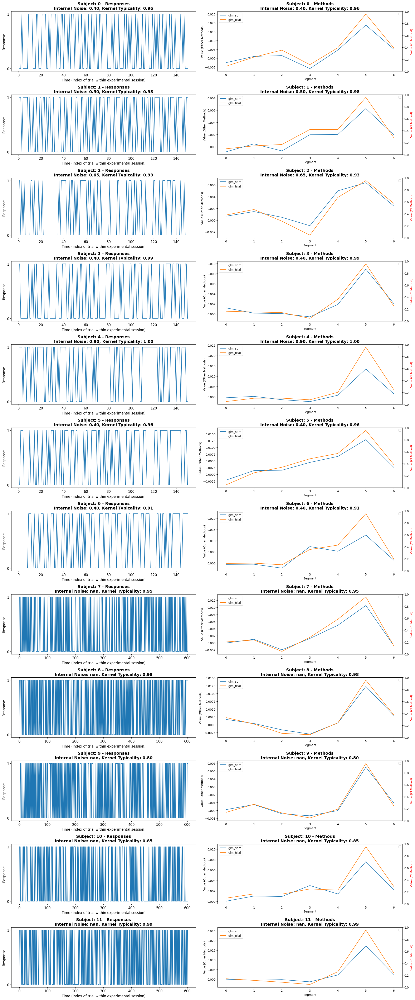

In [24]:
# Get the control sessions
control_sessions = revcor[(revcor.type == "controls") & (revcor.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

num_rows = len(control_sessions)

# Set up the figure to have two plots side by side for each subject
fig, axs = plt.subplots(num_rows, 2, figsize=(20, num_rows * 4))

for i, control_session in enumerate(zip(control_sessions.subject, control_sessions.session)):
    control = control_session[0]
    session = control_session[1]

    # Fetch the internal_noise_with_criteria and kernel_typicality values from revcor_measures dataframe for the control
    noise_value = revcor_measures[revcor_measures['subject'] == control]['internal_noise_with_criteria'].values[0]
    typicality_value = revcor_measures[revcor_measures['subject'] == control]['kernel_typicality'].values[0]

    # Filter the data for the current control and session for the response plot
    control_responses = revcor[(revcor.subject == control) & (revcor.session == session) & (revcor.stim_order == 0)].groupby('trial')['response'].first()

    # Plot the response for each session on the left subplot (axs[i, 0])
    axs[i, 0].plot(control_responses)
    axs[i, 0].set_yticks([0, 1])
    axs[i, 0].set_ylabel('Response', fontsize=12)
    axs[i, 0].set_xlabel('Time (index of trial within experimental session)', fontsize=12)
    axs[i, 0].grid(False)
    axs[i, 0].set_facecolor('white')
    axs[i, 0].tick_params(axis='both', which='major', labelsize=12)
    axs[i, 0].set_title(f'Subject: {control} - Responses\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

    # Filter data for the method plot
    subject_data = merged_df[merged_df['subject'] == control]
    subject_type = subject_data['type'].iloc[0]  # Get the subject's type

    # Plot methods that are not 'CI' on the primary y-axis (right subplot: axs[i, 1])
    non_ci_methods = subject_data[subject_data['method'] != 'CI']
    for method in non_ci_methods['method'].unique():
        data = non_ci_methods[non_ci_methods['method'] == method]
        axs[i, 1].plot(data['segment'], data['value'], label=method)

    # Create a secondary y-axis for the 'CI' method
    ax2 = axs[i, 1].twinx()
    ci_data = subject_data[subject_data['method'] == 'CI']
    if not ci_data.empty:
        ax2.plot(ci_data['segment'], ci_data['value'], label='CI', linestyle='--', color='r')

    axs[i, 1].set_xlabel('Segment')
    axs[i, 1].set_ylabel('Value (Other Methods)')
    ax2.set_ylabel('Value (CI Method)', color='r')
    axs[i, 1].legend(loc='upper left')
    ax2.legend(loc='upper right')
    axs[i, 1].set_title(f'Subject: {control} - Methods\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

# Adjust the layout to avoid overlap between subplots
plt.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

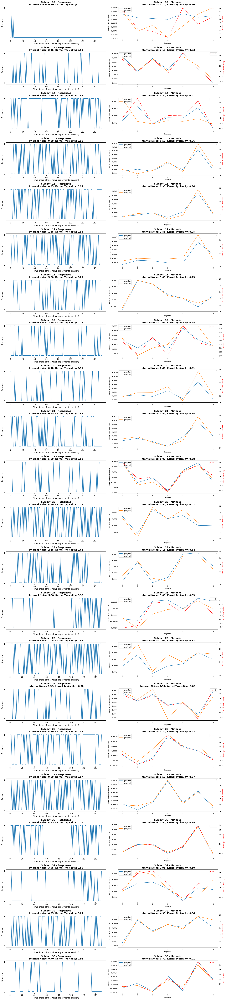

In [25]:
#patients = [12, 13, 14, 19, 22, 25, 27, 28, 30, 31, 33]

# Get the patient sessions
patient_sessions = revcor[(revcor.type == "patients") & (revcor.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

num_rows = len(patient_sessions)

# Set up the figure to have two plots side by side for each subject
fig, axs = plt.subplots(num_rows, 2, figsize=(20, num_rows * 4))

for i, patient_session in enumerate(zip(patient_sessions.subject, patient_sessions.session)):
    patient = patient_session[0]
    session = patient_session[1]

    # Fetch the internal_noise_with_criteria and kernel_typicality values from revcor_measures dataframe for the patient
    noise_value = revcor_measures[revcor_measures['subject'] == patient]['internal_noise_with_criteria'].values[0]
    typicality_value = revcor_measures[revcor_measures['subject'] == patient]['kernel_typicality'].values[0]

    # Filter the data for the current patient and session for the response plot
    patient_responses = revcor[(revcor.subject == patient) & (revcor.session == session) & (revcor.stim_order == 0)].groupby('trial')['response'].first()

    # Plot the response for each session on the left subplot (axs[i, 0])
    axs[i, 0].plot(patient_responses)
    axs[i, 0].set_yticks([0, 1])
    axs[i, 0].set_ylabel('Response', fontsize=12)
    axs[i, 0].set_xlabel('Time (index of trial within experimental session)', fontsize=12)
    axs[i, 0].grid(False)
    axs[i, 0].set_facecolor('white')
    axs[i, 0].tick_params(axis='both', which='major', labelsize=12)
    axs[i, 0].set_title(f'Subject: {patient} - Responses\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

    # Filter data for the method plot
    subject_data = merged_df[merged_df['subject'] == patient]
    subject_type = subject_data['type'].iloc[0]  # Get the subject's type

    # Plot methods that are not 'CI' on the primary y-axis (right subplot: axs[i, 1])
    non_ci_methods = subject_data[subject_data['method'] != 'CI']
    for method in non_ci_methods['method'].unique():
        data = non_ci_methods[non_ci_methods['method'] == method]
        axs[i, 1].plot(data['segment'], data['value'], label=method)

    # Create a secondary y-axis for the 'CI' method
    ax2 = axs[i, 1].twinx()
    ci_data = subject_data[subject_data['method'] == 'CI']
    if not ci_data.empty:
        ax2.plot(ci_data['segment'], ci_data['value'], label='CI', linestyle='--', color='r')

    axs[i, 1].set_xlabel('Segment')
    axs[i, 1].set_ylabel('Value (Other Methods)')
    ax2.set_ylabel('Value (CI Method)', color='r')
    axs[i, 1].legend(loc='upper left')
    ax2.legend(loc='upper right')
    axs[i, 1].set_title(f'Subject: {patient} - Methods\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

# Adjust the layout to avoid overlap between subplots
plt.tight_layout()
plt.show()

Above, we performed Maximum Likelihood Estimation to retrieve the generative parameters of the GLM-HMM in simulated data. In the small data regime, where we do not have many trials available to us, we may instead want to perform Maximum A Priori (MAP) Estimation in order to incorporate a prior term and restrict the range for the best fitting parameters. Unfortunately, what is meant by 'small data regime' is problem dependent and will be affected by the number of states in the generative GLM-HMM, and the specific parameters of the generative model, amongst other things. In practice, we may perform both Maximum Likelihood Estimation and MAP estimation and compare the ability of the fit models to make predictions on held-out data (see Section 5 on Cross-Validation below).  

The prior we consider for the GLM-HMM is the product of a Gaussian prior on the GLM weights, $W$, and a Dirichlet prior on the transition matrix, $A$:

$$
\begin{align}
\Pr(W, A) &= \mathcal{N}(W|0, \Sigma) \Pr(A|\alpha) \\&= \mathcal{N}(W|0, diag(\sigma^{2}, \cdots, \sigma^{2})) \prod_{j=1}^{K} \dfrac{1}{B(\alpha)} \prod_{k=1}^{K} A_{jk}^{\alpha -1}
\end{align}
$$

There are two hyperparameters controlling the strength of the prior: $\sigma$ and $\alpha$.  The larger the value of $\sigma$ and if $\alpha = 1$, the more similar MAP estimation will become to Maximum Likelihood Estimation, and the prior term will become an additive offset to the objective function of the GLM-HMM that is independent of the values of $W$ and $A$.  In comparison, setting $\sigma = 2$ and $\alpha = 2$ will result in the prior no longer being independent of $W$ and $\alpha$.  

In order to perform MAP estimation for the GLM-HMM with `ssm`, the new syntax is:

```python
ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs", 
             observation_kwargs=dict(C=num_categories,prior_sigma=prior_sigma),
             transitions="sticky", transition_kwargs=dict(alpha=prior_alpha,kappa=0))
```

where `prior_sigma` is the $\sigma$ parameter from above, and `prior_alpha` is the $\alpha$ parameter.

## 4. Fit GLM-HMM and perform recovery analysis: Maximum A Priori Estimation

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


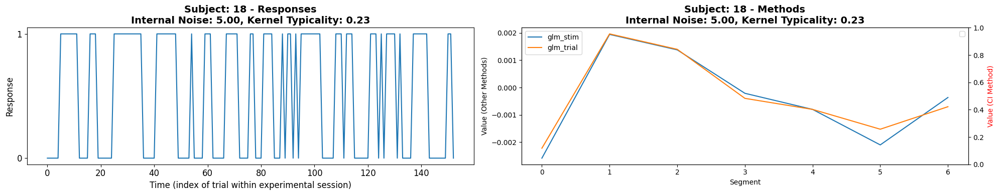

In [131]:
subject_id = 18
subject_df = df_diff[df_diff['subject'] == subject_id]
subject_df['choice_history'] = subject_df['response'].shift(1)
subject_df = subject_df.dropna(subset=['choice_history'])
subject_df
# Filter the sessions for the specific subject
patient_sessions = revcor[(revcor.subject == subject_id) & (revcor.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

# Set up a figure with two plots side by side for this subject
fig, axs = plt.subplots(1, 2, figsize=(20, 4))  # We only need one row since there's only one subject

# Extract the session for subject 13 (if any)
if not patient_sessions.empty:
    session = patient_sessions.session.iloc[0]

    # Fetch the internal_noise_with_criteria and kernel_typicality values from revcor_measures dataframe for the subject
    noise_value = revcor_measures[revcor_measures['subject'] == subject_id]['internal_noise_with_criteria'].values[0]
    typicality_value = revcor_measures[revcor_measures['subject'] == subject_id]['kernel_typicality'].values[0]

    # Filter the data for the current subject and session for the response plot
    patient_responses = revcor[(revcor.subject == subject_id) & (revcor.session == session) & (revcor.stim_order == 0)].groupby('trial')['response'].first()

    # Plot the response on the left subplot (axs[0])
    axs[0].plot(patient_responses)
    axs[0].set_yticks([0, 1])
    axs[0].set_ylabel('Response', fontsize=12)
    axs[0].set_xlabel('Time (index of trial within experimental session)', fontsize=12)
    axs[0].grid(False)
    axs[0].set_facecolor('white')
    axs[0].tick_params(axis='both', which='major', labelsize=12)
    axs[0].set_title(f'Subject: {subject_id} - Responses\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

    # Filter data for the method plot
    subject_data = merged_df[merged_df['subject'] == subject_id]

    # Plot methods that are not 'CI' on the primary y-axis (right subplot: axs[1])
    non_ci_methods = subject_data[subject_data['method'] != 'CI']
    for method in non_ci_methods['method'].unique():
        data = non_ci_methods[non_ci_methods['method'] == method]
        axs[1].plot(data['segment'], data['value'], label=method)

    # Create a secondary y-axis for the 'CI' method
    ax2 = axs[1].twinx()
    ci_data = subject_data[subject_data['method'] == 'CI']
    if not ci_data.empty:
        ax2.plot(ci_data['segment'], ci_data['value'], label='CI', linestyle='--', color='r')

    axs[1].set_xlabel('Segment')
    axs[1].set_ylabel('Value (Other Methods)')
    ax2.set_ylabel('Value (CI Method)', color='r')
    axs[1].legend(loc='upper left')
    ax2.legend(loc='upper right')
    axs[1].set_title(f'Subject: {subject_id} - Methods\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

# Adjust the layout to avoid overlap between subplots
plt.tight_layout()
plt.show()

In [132]:
covariate_columns = ['diff_pitch0', 'diff_pitch1', 'diff_pitch2', 'diff_pitch3', 
                     'diff_pitch4', 'diff_pitch5', 'diff_pitch6','choice_history']

output_column = 'response'

inputs_array_with_noise = subject_df[covariate_columns].values
#bias_term = np.ones((covariates.shape[0], 1))  # Create a column of ones

# Concatenate the bias term to the covariates
#covariates = np.hstack([bias_term, covariates])
responses_with_noise_array = subject_df[output_column].values.reshape(-1, 1) 

In [133]:
print("Shape of responses:", responses_with_noise_array.shape)
print("Shape of covariates:", inputs_array_with_noise.shape)

Shape of responses: (152, 1)
Shape of covariates: (152, 8)


In [134]:
npr.seed(0)
# Set the parameters of the GLM-HMM
num_states = 2        # number of discrete states
obs_dim = 1           # number of observed dimensions
num_categories = 2    # number of categories for output
input_dim = 8         # input dimensions

In [135]:
#prior_means = [(0, 1), (1, 0)]  # Means for (kernel, prev_resp) for each state
#prior_sigmas = [(0.001, 100), (100, 0.001)]  # Sigmas for (kernel, prev_resp) for each state
#alpha1 = 1.0  # Alpha for the first state
#alpha2 = 7.0
# Instantiate the GLM-HMM
#map_glmhmm = ssm.HMM(num_states, obs_dim, input_dim,
 #                    observations="ind_input_driven_obs",
  #                   observation_kwargs=dict(C=2, prior_means=prior_means, prior_sigmas=prior_sigmas),
   #                  transitions="sticky2", transition_kwargs=dict(alpha1=alpha1, alpha2=alpha2, kappa=0))


# Fit the model using EM with MAP estimation
#fit_map = map_glmhmm.fit(responses, inputs=covariates, method="em", num_iters=1000, tolerance=1e-4)

In [136]:
#prior_means = [(0, -.1), (0, 0)]  # Means for (kernel, prev_resp) for each state
#prior_sigmas = [(0.001, 0.1), (10, 0.001)]  # Sigmas for (kernel, prev_resp) for each state
#prior_alpha = 1.5
prior_means = [(0, 1.0), (0.0, 0)]  # Means for (kernel, prev_resp) for each state
prior_sigmas =[(0.01, 2), (0.1, 0.01)]
prior_alpha = 3
# Instantiate the GLM-HMM
map_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, 
             observations="ind_input_driven_obs", 
             observation_kwargs=dict(C=2, prior_means=prior_means, prior_sigmas=prior_sigmas), 
             transitions="sticky", transition_kwargs=dict(alpha=prior_alpha, kappa=0))

# Fit the model using EM with MAP estimation
fit_map = map_glmhmm.fit(responses_with_noise_array, inputs=inputs_array_with_noise, method="em", num_iters=1000, tolerance=1e-4)

  0%|          | 0/1000 [00:00<?, ?it/s]

Compare final likelihood of data with MAP estimation and MLE to likelihood under generative model (note: we cannot use log_probability that is output of `fit` function as this incorporates prior term, which is not comparable between generative and MAP models). We want to check that MAP and MLE likelihood values are higher than true likelihood; if they are not, this may indicate a poor initialization and that we should refit these models.

In [137]:
glm_weights_state=map_glmhmm.observations.params
glm_weights_state_1 = map_glmhmm.observations.params[0]  
glm_weights_state_2 = map_glmhmm.observations.params[1] 

In [138]:
print(glm_weights_state_1)
print(glm_weights_state_2)

[[ 0.          0.          0.          0.          0.          0.
   0.         -1.57116288]]
[[ 0.04479396 -0.04621351 -0.06109568 -0.01435187  0.05666952  0.01390456
   0.07097223  0.        ]]


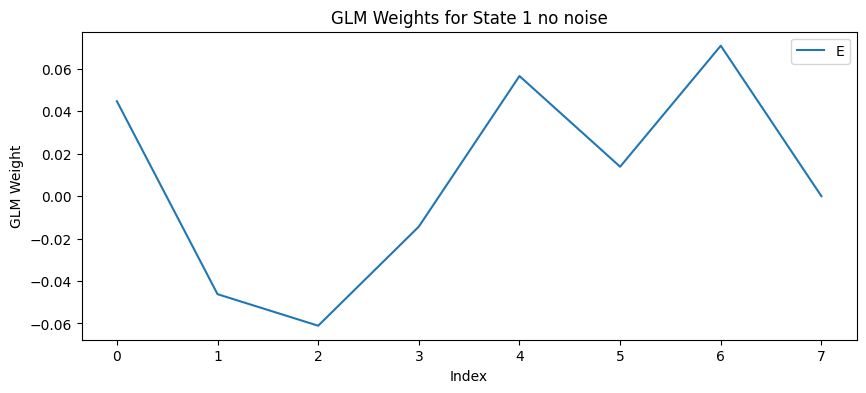

In [139]:
plt.figure(figsize=(10, 4))
for i in range(glm_weights_state_2.shape[0]):
    plt.plot(glm_weights_state_2[i], label=f'Row {i}')
plt.xlabel('Index')
plt.ylabel('GLM Weight')
plt.title('GLM Weights for State 1 no noise')
plt.legend('ENG')
plt.show()


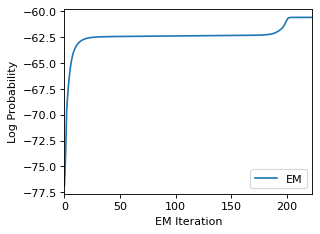

In [140]:
# Plot the log probabilities of the true and fit models. Fit model final LL should be greater 
# than or equal to true LL.
fig = plt.figure(figsize=(4, 3), dpi=80, facecolor='w', edgecolor='k')
plt.plot(fit_map, label="EM")
#plt.plot([0, len(fit_ll)], true_ll * np.ones(2), ':k', label="True")
plt.legend(loc="lower right")
plt.xlabel("EM Iteration")
plt.xlim(0, len(fit_map))
plt.ylabel("Log Probability")
plt.show()

### 3b. Retrieved parameters

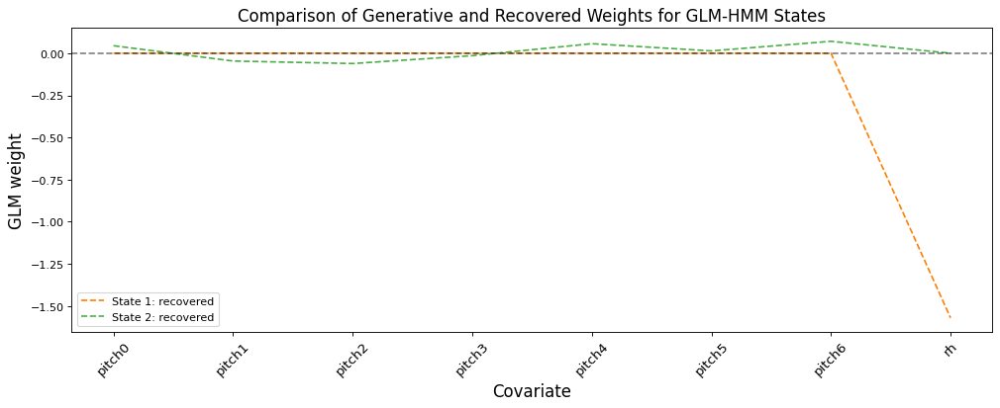

In [141]:
import matplotlib.pyplot as plt

# Set figure size and DPI for clarity
fig = plt.figure(figsize=(15, 5), dpi=80, facecolor='w', edgecolor='k')

# Define colors for each state
cols = ['#ff7f00', '#4daf4a', '#377eb8','#984ea3']  # Orange, Green, Blue for states

# Retrieve recovered weights from the GLM-HMM model
recovered_weights = (map_glmhmm.observations.params)

# Loop through the number of states and plot both generative and recovered weights
for k in range(num_states):
    # Plot the recovered weights for each state
    plt.plot(range(input_dim), (recovered_weights[k][0])[:], color=cols[k],
             lw=1.5, label=f"State {k+1}: recovered", linestyle='--')

# Set y-axis ticks font size
plt.yticks(fontsize=10)

# Add labels for the axes
plt.ylabel("GLM weight", fontsize=15)
plt.xlabel("Covariate", fontsize=15)

# Add horizontal line at y=0 to visualize where the weights cross zero
plt.axhline(y=0, color="k", alpha=0.5, ls="--")

# Add labels for covariates, modify according to the number of covariates in your data
plt.xticks(range(input_dim), ['pitch0', 'pitch1', 'pitch2', 'pitch3', 'pitch4', 'pitch5', 'pitch6','rh'], 
           fontsize=12, rotation=45)

# Add a legend to differentiate between generative and recovered weights for each state
plt.legend()

# Set the title for the plot
plt.title("Comparison of Generative and Recovered Weights for GLM-HMM States", fontsize=15)

# Display the plot
plt.show()


Text(0.5, 1.0, 'recovered')

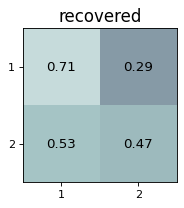

In [142]:
fig = plt.figure(figsize=(5, 2.5), dpi=80, facecolor='w', edgecolor='k')

recovered_trans_mat = np.exp(map_glmhmm.transitions.log_Ps)
plt.imshow(recovered_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(recovered_trans_mat.shape[0]):
    for j in range(recovered_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(recovered_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.title("recovered", fontsize = 15)


Text(0, 0.5, 'observation class')

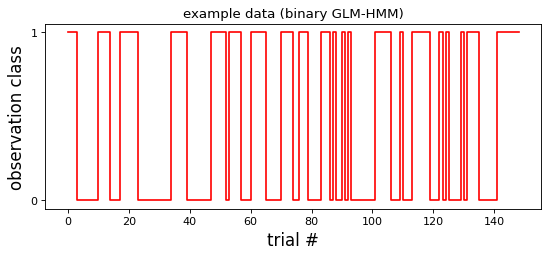

In [143]:
# plot example data:
fig = plt.figure(figsize=(8, 3), dpi=80, facecolor='w', edgecolor='k')
plt.step(range(149),responses_with_noise_array[range(149)], color = "red")
plt.yticks([0, 1])
plt.title("example data (binary GLM-HMM)")
plt.xlabel("trial #", fontsize = 15)
plt.ylabel("observation class", fontsize = 15)

### 3c. Posterior State Probabilities

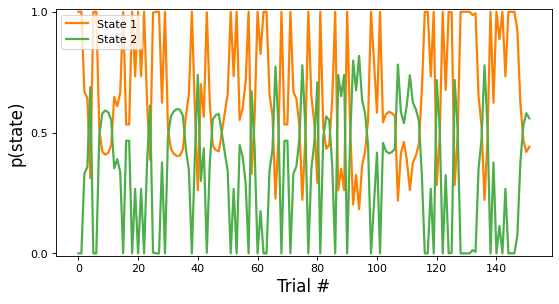

In [144]:
fig = plt.figure(figsize=(8, 4), dpi=80, facecolor='w', edgecolor='k')
posterior_probs = map_glmhmm.expected_states(data=responses_with_noise_array, input=inputs_array_with_noise)[0]

# Iterate through states and plot posterior probabilities
num_states = posterior_probs.shape[1]  # Assuming posterior_probs is (n_trials, num_states)

for k in range(num_states):
    plt.plot(posterior_probs[:, k], label="State " + str(k + 1), lw=2, color=cols[k])

# Set plot limits and labels
plt.ylim((-0.01, 1.01))
plt.yticks([0, 0.5, 1], fontsize=10)
plt.xlabel("Trial #", fontsize=15)
plt.ylabel("p(state)", fontsize=15)

# Add legend to distinguish between states
plt.legend()

# Show plot
plt.show()

In [145]:
most_likely_states = map_glmhmm.most_likely_states(responses_with_noise_array, input=inputs_array_with_noise)
perseverative_trials = responses_with_noise_array[most_likely_states == 0]
engaged_trials = responses_with_noise_array[most_likely_states == 1]

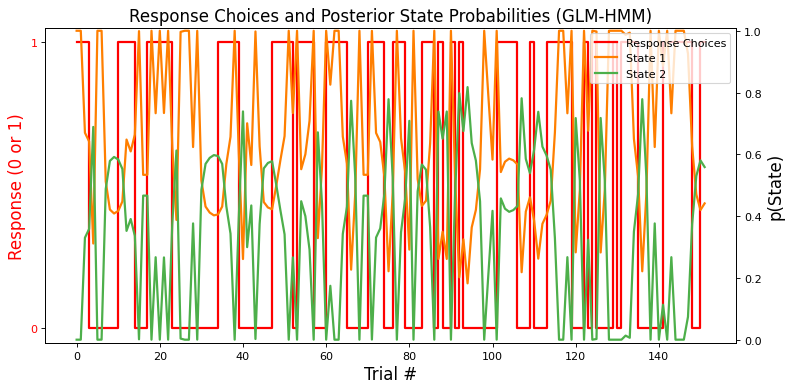

In [146]:
cols = ['#ff7f00', '#4daf4a', '#377eb8','#984ea3']

# Create a figure with dual y-axes
fig, ax1 = plt.subplots(figsize=(10, 5), dpi=80, facecolor='w', edgecolor='k')

# Plot the response choices (0 or 1) on the first y-axis (ax1)
ax1.step(range(len(responses_with_noise_array)), responses_with_noise_array, color="red", label="Response Choices", lw=2)
ax1.set_yticks([0, 1])
ax1.set_title("Response Choices and Posterior State Probabilities (GLM-HMM)", fontsize=15)
ax1.set_xlabel("Trial #", fontsize=15)
ax1.set_ylabel("Response (0 or 1)", fontsize=15, color="red")
ax1.tick_params(axis='y', labelcolor="red")

# Create a second y-axis (ax2) to plot the posterior state probabilities
ax2 = ax1.twinx()
for k in range(num_states):
    ax2.plot(range(len(responses_with_noise_array)), posterior_probs[:, k], label="State " + str(k + 1), lw=2, color=cols[k])

# Adjust limits and labels for the second axis
ax2.set_ylim((-0.01, 1.01))
ax2.set_ylabel("p(State)", fontsize=15)
ax2.tick_params(axis='y')

# Add combined legend for response choices and state probabilities
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper right")

# Show the plot
plt.tight_layout()
plt.show()

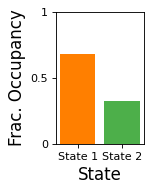

In [147]:
# Custom colors
cols = ['#ff7f00', '#4daf4a', '#377eb8', '#984ea3']

# Concatenate the posterior probabilities along the first axis (trials)
posterior_probs_concat = np.vstack(posterior_probs)  # Stack arrays row-wise

# Get the state with the maximum posterior probability at each trial
state_max_posterior = np.argmax(posterior_probs_concat, axis=1)

# Obtain state fractional occupancies
_, state_occupancies = np.unique(state_max_posterior, return_counts=True)
state_occupancies = state_occupancies / np.sum(state_occupancies)

# Plot
fig = plt.figure(figsize=(2, 2.5), dpi=80, facecolor='w', edgecolor='k')
for z, occ in enumerate(state_occupancies):
    plt.bar(z, occ, width=0.8, color=cols[z])  # Apply custom colors
plt.ylim((0, 1))
plt.xticks([0, 1], ['State 1', 'State 2'], fontsize=10)  # Adjust if more than 2 states
plt.yticks([0, 0.5, 1], ['0', '0.5', '1'], fontsize=10)
plt.xlabel('State', fontsize=15)
plt.ylabel('Frac. Occupancy', fontsize=15)

plt.tight_layout()
plt.show()


## 5. Cross Validation

To assess which model is better - the model fit via Maximum Likelihood Estimation, or the model fit via MAP estimation - we can investigate the predictive power of these fit models on held-out test data sets.

In [ ]:
prior_means_range = [(0, 1), (0, 1)]  # Example ranges for the mean values
prior_sigmas_range = [(0.1, 5), (0.1, 5)]  # Example ranges for standard deviation
prior_alpha_range = (1, 6)  # Range for alpha values

# Function to fit GLM-HMM with given parameters and return the negative log-likelihood
def objective(params):
    prior_mean_1, prior_mean_2, prior_sigma_1, prior_sigma_2, alpha = params

    # Define prior_means and prior_sigmas based on the parameters provided
    prior_means = [(0, prior_mean_1), (prior_mean_2, 0)]
    prior_sigmas = [(0.01, prior_sigma_1), (prior_sigma_2,0.01 )]
    prior_alpha = alpha

    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    fold_scores = []

    # Split the data and fit model for cross-validation
    for train_index, val_index in kf.split(inputs_array_with_noise):
        # Split into training and validation sets
        X_train, X_val = inputs_array_with_noise[train_index], inputs_array_with_noise[val_index]
        y_train, y_val = responses_with_noise_array[train_index], responses_with_noise_array[val_index]

        # Instantiate the GLM-HMM model
        map_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, 
                             observations="ind_input_driven_obs", 
                             observation_kwargs=dict(C=2, prior_means=prior_means, prior_sigmas=prior_sigmas), 
                             transitions="sticky", transition_kwargs=dict(alpha=prior_alpha, kappa=0))
        
        # Fit the model using EM with MAP estimation
        fit_map = map_glmhmm.fit(y_train, inputs=X_train, method="em", num_iters=500, tolerance=1e-4)
        
        # Evaluate log-likelihood on validation set
        val_loglikelihood = map_glmhmm.log_probability(y_val, inputs=X_val)
        fold_scores.append(val_loglikelihood)
    
    # Return negative average log-likelihood (for minimization)
    avg_score = np.mean(fold_scores)
    return -avg_score

# Define the bounds for optimization
bounds = [
    (-1, 1),     # prior_mean_1
    (-1, 1),     # prior_mean_2
    (0.001, 0.5), # prior_sigma_1
    (0.001, 0.5), # prior_sigma_2
    (0.1, 5)     # alpha
]

# Use Bayesian optimization to find the best hyperparameters
result = gp_minimize(objective, bounds, n_calls=30, random_state=42)

# Extract the best parameters
best_params = result.x
prior_means_best = [(0, best_params[0]), (0, best_params[1])]
prior_sigmas_best = [(best_params[2], 0.1), (10, best_params[3])]
prior_alpha_best = best_params[4]

# Fit the model with the best parameters
best_glmhmm = ssm.HMM(num_states, obs_dim, input_dim,
                      observations="ind_input_driven_obs",
                      observation_kwargs=dict(C=2, prior_means=prior_means_best, prior_sigmas=prior_sigmas_best),
                      transitions="sticky", transition_kwargs=dict(alpha=prior_alpha_best, kappa=0))

fit_map_best = best_glmhmm.fit(responses_with_noise_array, inputs=inputs_array_with_noise, method="em", num_iters=1000, tolerance=1e-4)

print("Best Hyperparameters Found:")
print("Prior Means:", prior_means_best)
print("Prior Sigmas:", prior_sigmas_best)
print("Prior Alpha:", prior_alpha_best)


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

AssertionError: mode is well defined only when transition matrix entries are non-negative! Check alpha >= 1

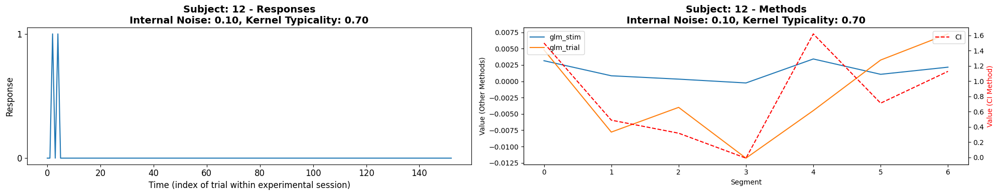

In [151]:
subject_id = 12
subject_df = df_diff[df_diff['subject'] == subject_id]
subject_df['choice_history'] = subject_df['response'].shift(1)
subject_df = subject_df.dropna(subset=['choice_history'])
subject_df
# Filter the sessions for the specific subject
patient_sessions = revcor[(revcor.subject == subject_id) & (revcor.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

# Set up a figure with two plots side by side for this subject
fig, axs = plt.subplots(1, 2, figsize=(20, 4))  # We only need one row since there's only one subject

# Extract the session for subject 13 (if any)
if not patient_sessions.empty:
    session = patient_sessions.session.iloc[0]

    # Fetch the internal_noise_with_criteria and kernel_typicality values from revcor_measures dataframe for the subject
    noise_value = revcor_measures[revcor_measures['subject'] == subject_id]['internal_noise_with_criteria'].values[0]
    typicality_value = revcor_measures[revcor_measures['subject'] == subject_id]['kernel_typicality'].values[0]

    # Filter the data for the current subject and session for the response plot
    patient_responses = revcor[(revcor.subject == subject_id) & (revcor.session == session) & (revcor.stim_order == 0)].groupby('trial')['response'].first()

    # Plot the response on the left subplot (axs[0])
    axs[0].plot(patient_responses)
    axs[0].set_yticks([0, 1])
    axs[0].set_ylabel('Response', fontsize=12)
    axs[0].set_xlabel('Time (index of trial within experimental session)', fontsize=12)
    axs[0].grid(False)
    axs[0].set_facecolor('white')
    axs[0].tick_params(axis='both', which='major', labelsize=12)
    axs[0].set_title(f'Subject: {subject_id} - Responses\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

    # Filter data for the method plot
    subject_data = merged_df[merged_df['subject'] == subject_id]

    # Plot methods that are not 'CI' on the primary y-axis (right subplot: axs[1])
    non_ci_methods = subject_data[subject_data['method'] != 'CI']
    for method in non_ci_methods['method'].unique():
        data = non_ci_methods[non_ci_methods['method'] == method]
        axs[1].plot(data['segment'], data['value'], label=method)

    # Create a secondary y-axis for the 'CI' method
    ax2 = axs[1].twinx()
    ci_data = subject_data[subject_data['method'] == 'CI']
    if not ci_data.empty:
        ax2.plot(ci_data['segment'], ci_data['value'], label='CI', linestyle='--', color='r')

    axs[1].set_xlabel('Segment')
    axs[1].set_ylabel('Value (Other Methods)')
    ax2.set_ylabel('Value (CI Method)', color='r')
    axs[1].legend(loc='upper left')
    ax2.legend(loc='upper right')
    axs[1].set_title(f'Subject: {subject_id} - Methods\nInternal Noise: {noise_value:.2f}, Kernel Typicality: {typicality_value:.2f}', fontsize=14, fontweight='bold')

# Adjust the layout to avoid overlap between subplots
plt.tight_layout()
plt.show()

In [152]:
covariate_columns = ['diff_pitch0', 'diff_pitch1', 'diff_pitch2', 'diff_pitch3', 
                     'diff_pitch4', 'diff_pitch5', 'diff_pitch6','choice_history']

output_column = 'response'

inputs_array_with_noise = subject_df[covariate_columns].values
#bias_term = np.ones((covariates.shape[0], 1))  # Create a column of ones

# Concatenate the bias term to the covariates
#covariates = np.hstack([bias_term, covariates])
responses_with_noise_array = subject_df[output_column].values.reshape(-1, 1) 

In [153]:
print("Shape of responses:", responses_with_noise_array.shape)
print("Shape of covariates:", inputs_array_with_noise.shape)

Shape of responses: (152, 1)
Shape of covariates: (152, 8)


Best Log-Likelihood: 52.032725023115034
Best Parameters:
  Means: [(0, 0.0), (-1.0, 0)]
  Sigmas: [(0.01, 5.005), (0.01, 0.01)]
  Alpha: 1


  0%|          | 0/500 [00:00<?, ?it/s]

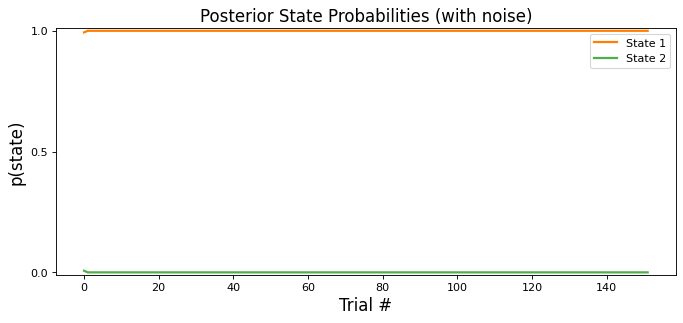

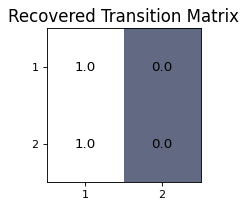

In [154]:
# Set the parameters of the GLM-HMM
npr.seed(0)
num_states = 2        # number of discrete states
obs_dim = 1           # number of observed dimensions
num_categories = 2    # number of categories for output
input_dim = 8         # input dimensions

# Define reduced ranges for prior means, sigmas, and alpha to speed up the grid search
mean_range_1 = np.linspace(-1, 1, 3)  # Reduced range for first state mean
mean_range_2 = np.linspace(-1, 1, 3)  # Reduced range for second state mean
sigma_range_1 = np.linspace(0.01, 10, 5)  # Reduced range for first state sigma
sigma_range_2 = np.linspace(0.01, 10, 5)  # Reduced range for second state sigma
alpha_range = np.arange(1, 4)  # Reduced range for alpha values

best_log_likelihood = float('-inf')
best_params = None

# Function to fit the model and calculate Log-Likelihood
def fit_glmhmm(mean_value_1, mean_value_2, sigma_value_1, sigma_value_2, alpha_value, train_indices, val_indices):
    # Ensure different values for mean_1 and mean_2, sigma_1 and sigma_2
    if mean_value_1 == mean_value_2 or sigma_value_1 == sigma_value_2:
        return float('-inf'), None

    prior_means = [(0, mean_value_1), (mean_value_2, 0)]
    prior_sigmas = [(0.01, sigma_value_1), (sigma_value_2, 0.01)]
    prior_alpha = alpha_value

    # Instantiate the GLM-HMM
    map_glmhmm_with_noise = ssm.HMM(
        num_states, obs_dim, input_dim,
        observations="ind_input_driven_obs",
        observation_kwargs=dict(C=2, prior_means=prior_means, prior_sigmas=prior_sigmas),
        transitions="sticky", transition_kwargs=dict(alpha=prior_alpha, kappa=0)
    )

    # Split data into training and validation
    responses_train = responses_with_noise_array[train_indices]
    inputs_train = inputs_array_with_noise[train_indices]
    responses_val = responses_with_noise_array[val_indices]
    inputs_val = inputs_array_with_noise[val_indices]

    # Fit the model using EM with MAP estimation
    map_glmhmm_with_noise.fit(
        responses_train, inputs=inputs_train, method="em", num_iters=500, tolerance=1e-4
    )

    # Calculate log-likelihood on validation set
    log_likelihood = map_glmhmm_with_noise.log_probability(responses_val, inputs=inputs_val)

    return log_likelihood, (prior_means, prior_sigmas, prior_alpha)

# Set up cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=0)

# Run the grid search with cross-validation in parallel
results = []
for train_indices, val_indices in kf.split(responses_with_noise_array):
    results.extend(Parallel(n_jobs=-1)(
        delayed(fit_glmhmm)(mean_value_1, mean_value_2, sigma_value_1, sigma_value_2, alpha_value, train_indices, val_indices)
        for mean_value_1 in mean_range_1
        for mean_value_2 in mean_range_2
        for sigma_value_1 in sigma_range_1
        for sigma_value_2 in sigma_range_2
        for alpha_value in alpha_range
    ))

# Find the best parameters and Log-Likelihood
for log_likelihood, params in results:
    if log_likelihood > best_log_likelihood and params is not None:
        best_log_likelihood = log_likelihood
        best_params = params

print("Best Log-Likelihood:", best_log_likelihood)
print("Best Parameters:")
print("  Means:", best_params[0])
print("  Sigmas:", best_params[1])
print("  Alpha:", best_params[2])

# Posterior probabilities for each trial with the best parameters
prior_means, prior_sigmas, prior_alpha = best_params
map_glmhmm_with_noise = ssm.HMM(
    num_states, obs_dim, input_dim,
    observations="ind_input_driven_obs",
    observation_kwargs=dict(C=2, prior_means=prior_means, prior_sigmas=prior_sigmas),
    transitions="sticky", transition_kwargs=dict(alpha=prior_alpha, kappa=0)
)

# Fit the model using EM with MAP estimation
fit_map_with_noise = map_glmhmm_with_noise.fit(
    responses_with_noise_array, inputs=inputs_array_with_noise, method="em", num_iters=500, tolerance=1e-4
)

# Extract GLM weights after fitting
map_glm_weights_state_with_noise = map_glmhmm_with_noise.observations.params

# Posterior probabilities for each trial
posterior_probs_map_with_noise = map_glmhmm_with_noise.expected_states(
    data=responses_with_noise_array, input=inputs_array_with_noise
)[0]

# Plot posterior state probabilities for each trial (with noise)
cols = ['#ff7f00', '#4daf4a', '#377eb8', '#984ea3']
fig, ax1 = plt.subplots(figsize=(10, 4), dpi=80, facecolor='w', edgecolor='k')

num_states = posterior_probs_map_with_noise.shape[1]
for k in range(num_states):
    ax1.plot(posterior_probs_map_with_noise[:, k], label="State " + str(k + 1), lw=2, color=cols[k])

ax1.set_ylim((-0.01, 1.01))
ax1.set_yticks([0, 0.5, 1])
ax1.set_xlabel("Trial #", fontsize=15)
ax1.set_ylabel("p(state)", fontsize=15)
ax1.set_title("Posterior State Probabilities (with noise)", fontsize=15)
ax1.legend()

plt.show()

# Plot the recovered transition matrix for the best parameters
fig = plt.figure(figsize=(5, 2.5), dpi=80, facecolor='w', edgecolor='k')
map_recovered_trans_mat_with_noise = np.exp(map_glmhmm_with_noise.transitions.log_Ps)
plt.imshow(map_recovered_trans_mat_with_noise, vmin=-0.8, vmax=1, cmap='bone')
for i in range(map_recovered_trans_mat_with_noise.shape[0]):
    for j in range(map_recovered_trans_mat_with_noise.shape[1]):
        text = plt.text(j, i, str(np.around(map_recovered_trans_mat_with_noise[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.title("Recovered Transition Matrix", fontsize=15)
plt.show()


Best Log-Likelihood: 48.60082774724143
Best Parameters:
  Means: [(0, -1.0), (0.0, 0)]
  Sigmas: [(0.01, 5.005), (0.01, 0.01)]
  Alpha: 1


  0%|          | 0/500 [00:00<?, ?it/s]

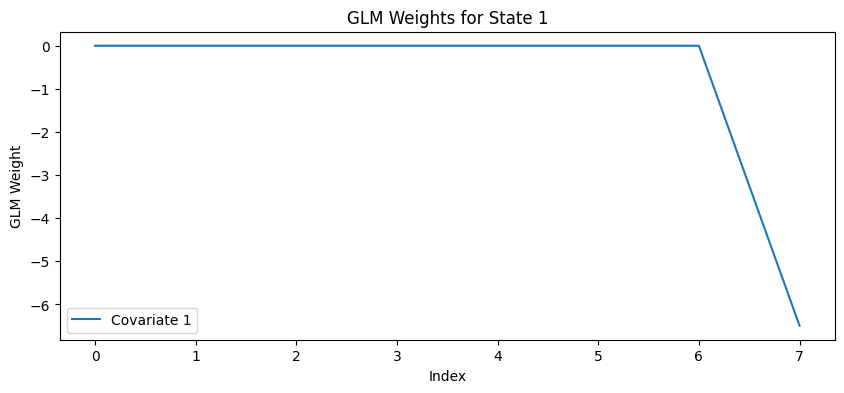

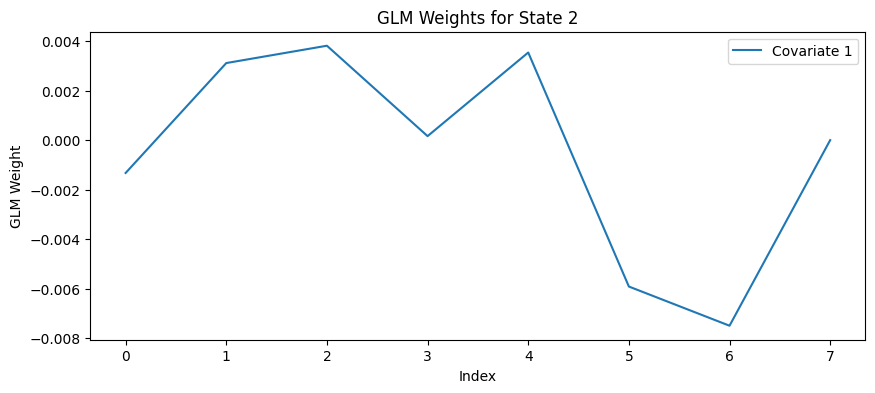

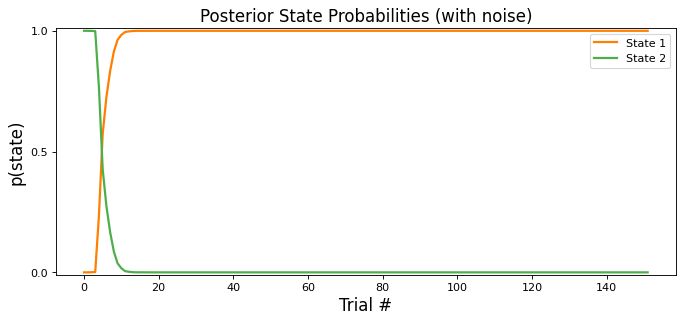

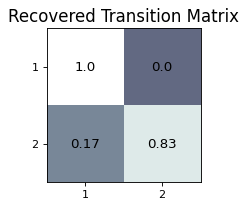

In [155]:
num_states = 2        # number of discrete states
obs_dim = 1           # number of observed dimensions
num_categories = 2    # number of categories for output
input_dim = 8         # input dimensions

# Define reduced ranges for prior means, sigmas, and alpha to speed up the grid search
mean_range_1 = np.linspace(-1, 1, 3)  # Reduced range for first state mean
mean_range_2 = np.linspace(-1, 1, 3)  # Reduced range for second state mean
sigma_range_1 = np.linspace(0.01, 10, 5)  # Reduced range for first state sigma
sigma_range_2 = np.linspace(0.01, 10, 5)  # Reduced range for second state sigma
alpha_range = np.arange(1, 4)  # Reduced range for alpha values

best_log_likelihood = float('-inf')
best_params = None

# Function to fit the model and calculate Log-Likelihood
def fit_glmhmm(mean_value_1, mean_value_2, sigma_value_1, sigma_value_2, alpha_value):
    # Ensure different values for mean_1 and mean_2, sigma_1 and sigma_2
    if mean_value_1 == mean_value_2 or sigma_value_1 == sigma_value_2:
        return float('-inf'), None

    prior_means = [(0, mean_value_1), (mean_value_2, 0)]
    prior_sigmas = [(0.01, sigma_value_1), (sigma_value_2, 0.01)]
    prior_alpha = alpha_value

    # Instantiate the GLM-HMM
    map_glmhmm_with_noise = ssm.HMM(
        num_states, obs_dim, input_dim,
        observations="ind_input_driven_obs",
        observation_kwargs=dict(C=2, prior_means=prior_means, prior_sigmas=prior_sigmas),
        transitions="sticky", transition_kwargs=dict(alpha=prior_alpha, kappa=0)
    )

    # Fit the model using EM with MAP estimation
    fit_map_with_noise = map_glmhmm_with_noise.fit(
        responses_with_noise_array, inputs=inputs_array_with_noise, method="em", num_iters=500, tolerance=1e-4
    )

    # Calculate log-likelihood
    log_likelihood = map_glmhmm_with_noise.log_probability(responses_with_noise_array, inputs=inputs_array_with_noise)

    return log_likelihood, (prior_means, prior_sigmas, prior_alpha)

# Run the grid search in parallel
results = Parallel(n_jobs=-1)(
    delayed(fit_glmhmm)(mean_value_1, mean_value_2, sigma_value_1, sigma_value_2, alpha_value)
    for mean_value_1 in mean_range_1
    for mean_value_2 in mean_range_2
    for sigma_value_1 in sigma_range_1
    for sigma_value_2 in sigma_range_2
    for alpha_value in alpha_range
)

# Find the best parameters and Log-Likelihood
for log_likelihood, params in results:
    if log_likelihood > best_log_likelihood and params is not None:
        best_log_likelihood = log_likelihood
        best_params = params

print("Best Log-Likelihood:", best_log_likelihood)
print("Best Parameters:")
print("  Means:", best_params[0])
print("  Sigmas:", best_params[1])
print("  Alpha:", best_params[2])

# Posterior probabilities for each trial with the best parameters
prior_means, prior_sigmas, prior_alpha = best_params
map_glmhmm_with_noise = ssm.HMM(
    num_states, obs_dim, input_dim,
    observations="ind_input_driven_obs",
    observation_kwargs=dict(C=2, prior_means=prior_means, prior_sigmas=prior_sigmas),
    transitions="sticky", transition_kwargs=dict(alpha=prior_alpha, kappa=0)
)

# Fit the model using EM with MAP estimation
fit_map_with_noise = map_glmhmm_with_noise.fit(
    responses_with_noise_array, inputs=inputs_array_with_noise, method="em", num_iters=500, tolerance=1e-4
)

# Extract GLM weights after fitting
map_glm_weights_state_with_noise = map_glmhmm_with_noise.observations.params

# Plot GLM Weights for each state
for state in range(num_states):
    glm_weights_state = map_glm_weights_state_with_noise[state]
    plt.figure(figsize=(10, 4))
    for i in range(glm_weights_state.shape[0]):
        plt.plot(glm_weights_state[i], label=f'Covariate {i + 1}')
    plt.xlabel('Index')
    plt.ylabel('GLM Weight')
    plt.title(f'GLM Weights for State {state + 1}')
    plt.legend()
    plt.show()

# Posterior probabilities for each trial
posterior_probs_map_with_noise = map_glmhmm_with_noise.expected_states(
    data=responses_with_noise_array, input=inputs_array_with_noise
)[0]

# Plot posterior state probabilities for each trial (with noise)
cols = ['#ff7f00', '#4daf4a', '#377eb8', '#984ea3']
fig, ax1 = plt.subplots(figsize=(10, 4), dpi=80, facecolor='w', edgecolor='k')

num_states = posterior_probs_map_with_noise.shape[1]
for k in range(num_states):
    ax1.plot(posterior_probs_map_with_noise[:, k], label="State " + str(k + 1), lw=2, color=cols[k])

ax1.set_ylim((-0.01, 1.01))
ax1.set_yticks([0, 0.5, 1])
ax1.set_xlabel("Trial #", fontsize=15)
ax1.set_ylabel("p(state)", fontsize=15)
ax1.set_title("Posterior State Probabilities (with noise)", fontsize=15)
ax1.legend()

plt.show()

# Plot the recovered transition matrix for the best parameters
fig = plt.figure(figsize=(5, 2.5), dpi=80, facecolor='w', edgecolor='k')
map_recovered_trans_mat_with_noise = np.exp(map_glmhmm_with_noise.transitions.log_Ps)
plt.imshow(map_recovered_trans_mat_with_noise, vmin=-0.8, vmax=1, cmap='bone')
for i in range(map_recovered_trans_mat_with_noise.shape[0]):
    for j in range(map_recovered_trans_mat_with_noise.shape[1]):
        text = plt.text(j, i, str(np.around(map_recovered_trans_mat_with_noise[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.title("Recovered Transition Matrix", fontsize=15)
plt.show()


In [32]:
# Create additional input sequences to be used as held-out test data
num_test_sess = 10
test_inpts = np.ones((num_test_sess, num_trials_per_sess, input_dim)) 
test_inpts[:,:,0] = np.random.choice(stim_vals, (num_test_sess, num_trials_per_sess)) 
test_inpts = list(test_inpts)

In [33]:
# Create set of test latents and choices to accompany input sequences:
test_latents, test_choices = [], []
for sess in range(num_test_sess):
    test_z, test_y = true_glmhmm.sample(num_trials_per_sess, input=test_inpts[sess])
    test_latents.append(test_z)
    test_choices.append(test_y)

In [34]:
# Compare likelihood of test_choices for model fit with MLE and MAP:
mle_test_ll = new_glmhmm.log_likelihood(test_choices, inputs=test_inpts) 
map_test_ll = map_glmhmm.log_likelihood(test_choices, inputs=test_inpts) 

Text(0, 0.5, 'loglikelihood')

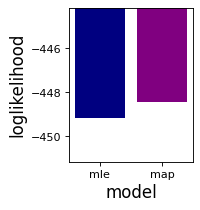

In [35]:
fig = plt.figure(figsize=(2, 2.5), dpi=80, facecolor='w', edgecolor='k')
loglikelihood_vals = [mle_test_ll, map_test_ll]
colors = ['Navy', 'Purple']
for z, occ in enumerate(loglikelihood_vals):
    plt.bar(z, occ, width = 0.8, color = colors[z])
plt.ylim((mle_test_ll-2, mle_test_ll+5))
plt.xticks([0, 1], ['mle', 'map'], fontsize = 10)
plt.xlabel('model', fontsize = 15)
plt.ylabel('loglikelihood', fontsize=15)

Here we see that the model fit with MAP estimation achieves higher likelihood on the held-out dataset than the model fit with MLE, so we would choose this model as the best model of animal decision-making behavior (although we'd probably want to perform multiple fold cross-validation to be sure that this is the case in all instantiations of test data).   

Let's finish by comparing the retrieved weights and transition matrices from MAP estimation to the generative parameters.

In [36]:
map_glmhmm.permute(find_permutation(true_latents[0], map_glmhmm.most_likely_states(true_choices[0], input=inpts[0])))

Text(0.5, 1.0, 'MAP')

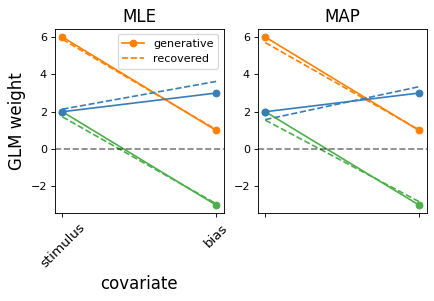

In [37]:
fig = plt.figure(figsize=(6, 3), dpi=80, facecolor='w', edgecolor='k')
cols = ['#ff7f00', '#4daf4a', '#377eb8']
plt.subplot(1,2,1)
recovered_weights = new_glmhmm.observations.params
for k in range(num_states):
    if k ==0: # show labels only for first state
        plt.plot(range(input_dim), gen_weights[k][0], marker='o',
                 color=cols[k],
                 lw=1.5, label="generative")
        plt.plot(range(input_dim), recovered_weights[k][0], color=cols[k],
                     lw=1.5,  label = 'recovered', linestyle='--')   
    else:
        plt.plot(range(input_dim), gen_weights[k][0], marker='o',
                 color=cols[k], 
                 lw=1.5, label="")
        plt.plot(range(input_dim), recovered_weights[k][0], color=cols[k],
                     lw=1.5,  label = '', linestyle='--')
plt.yticks(fontsize=10)
plt.ylabel("GLM weight", fontsize=15)
plt.xlabel("covariate", fontsize=15)
plt.xticks([0, 1], ['stimulus', 'bias'], fontsize=12, rotation=45)
plt.axhline(y=0, color="k", alpha=0.5, ls="--")
plt.title("MLE", fontsize = 15)
plt.legend()

plt.subplot(1,2,2)
recovered_weights = map_glmhmm.observations.params
for k in range(num_states):
    plt.plot(range(input_dim), gen_weights[k][0], marker='o',
             color=cols[k],
             lw=1.5, label="", linestyle = '-')
    plt.plot(range(input_dim), recovered_weights[k][0], color=cols[k],
                 lw=1.5,  label = '', linestyle='--')
plt.yticks(fontsize=10)
plt.xticks([0, 1], ['', ''], fontsize=12, rotation=45)
plt.axhline(y=0, color="k", alpha=0.5, ls="--")
plt.title("MAP", fontsize = 15)

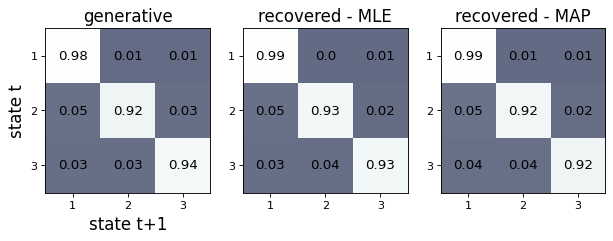

In [38]:
fig = plt.figure(figsize=(7, 2.5), dpi=80, facecolor='w', edgecolor='k')
plt.subplot(1, 3, 1)
gen_trans_mat = np.exp(gen_log_trans_mat)[0]
plt.imshow(gen_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(gen_trans_mat.shape[0]):
    for j in range(gen_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(gen_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.ylabel("state t", fontsize = 15)
plt.xlabel("state t+1", fontsize = 15)
plt.title("generative", fontsize = 15)


plt.subplot(1, 3, 2)
recovered_trans_mat = np.exp(new_glmhmm.transitions.log_Ps)
plt.imshow(recovered_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(recovered_trans_mat.shape[0]):
    for j in range(recovered_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(recovered_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.title("recovered - MLE", fontsize = 15)
plt.subplots_adjust(0, 0, 1, 1)


plt.subplot(1, 3, 3)
recovered_trans_mat = np.exp(map_glmhmm.transitions.log_Ps)
plt.imshow(recovered_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(recovered_trans_mat.shape[0]):
    for j in range(recovered_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(recovered_trans_mat[i, j], decimals=2)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.title("recovered - MAP", fontsize = 15)
plt.subplots_adjust(0, 0, 1, 1)